# Описание проекта

Исследование интернет-магазина «Подарочек»

Магазин зачастую отправляет товары по почте, работает как с оптовыми, так и с розничными покупателями. 

Необходимо:
- провести EDA
- провести расчет метрик
- провести RFM-сегментацию клиентов
- проверить статистические гипотезы
- написать общие выводы

# Описание данных

Основной датасет. 'gift.csv'
- entry_date — дата записи;
- order_id — идентификационный номер заказа;
- customer_id — идентификационный номер клиента;
- quantity — количество;
- price — цена;
- name_clust — автоматически присвоенная группа записи на основе названия;
- entry_id — идентификационный номер записи;
- country_id — идентификационный номер страны
  
Текстовое описание записей. 'gift_entry.csv'
- entry_id — идентификационный номер записи;
- entry — запись


# Первичный анализ данных

## Основной датасет 'gift.csv'

In [1]:
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import plotly.express as px

from scipy.stats import ttest_ind
from scipy.stats import ttest_rel
from statsmodels.stats.proportion import proportions_ztest

In [2]:
# загружаем основной датасет 'gift.csv' и вспомогательный 'gift_entry.csv'
df_gift = pd.read_csv('https://code.s3.yandex.net/datasets/gift.csv')

# создаем копии
df_gift_copy = df_gift.copy()

# выводим датасет
print(df_gift.shape)
display(df_gift.head(3))
display(df_gift.sample(2))
#print(df_gift['name_clust'].nunique())
#print(df_gift['name_clust'].unique(5))

# изучаем типы данных и определяем, соответствуют ли они содержимому
print(df_gift.info())

# выводим стат показатели
display(df_gift.describe(include = 'all'))


(356940, 8)


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
0,12/01/2018 08:26,3031,2150,6,339,740,891,28
1,12/01/2018 08:26,3031,2150,8,275,132,1596,28
2,12/01/2018 08:26,3031,2150,6,339,197,166,28


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
252197,10/07/2019 08:12,36664,7460,25,42,171,465,23
354389,12/08/2019 13:36,48066,5944,7,395,819,1907,28


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 356940 entries, 0 to 356939
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   entry_date   356940 non-null  object
 1   order_id     356940 non-null  int64 
 2   customer_id  356940 non-null  int64 
 3   quantity     356940 non-null  int64 
 4   price        356940 non-null  int64 
 5   name_clust   356940 non-null  int64 
 6   entry_id     356940 non-null  int64 
 7   country_id   356940 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 21.8+ MB
None


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
count,356940,356940.000000,356940.000000,356940.000000,3.569400e+05,356940.000000,356940.000000,356940.000000
unique,18794,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,31/10/2019 14:41,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,770,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,26687.651726,3486.883389,10.149599,3.999940e+02,468.617395,1518.046442,26.751818
std,NaN,13381.350493,2542.878257,146.794372,5.059181e+03,259.146901,833.753264,4.978016
min,NaN,3031.000000,-1.000000,-9600.000000,-1.106206e+06,0.000000,0.000000,0.000000
25%,NaN,14834.000000,-1.000000,1.000000,1.250000e+02,242.000000,875.000000,28.000000
50%,NaN,27378.000000,3633.000000,3.000000,2.080000e+02,448.000000,1559.000000,28.000000
75%,NaN,38512.000000,5627.500000,10.000000,4.130000e+02,702.000000,2223.000000,28.000000


## Вывод по df_gift

- Данные содержат 356940 строк и 8 столбцов

- Названия меток строк соответствуют спецификации данных

- Название полей соответствует содержимому

- Значения некоторых полей не соответствуют названию

  customer_id - идентификационный номер клиента - содержит значение "-1" (ниже исследуем ситуацию)

  price - цена - есть отрицательные значения (ниже исследуем ситуацию)

  quantity - количество - есть отрицательные значения (ниже исследуем ситуацию)

- Поля не содержат пропущенных значений

- Столбцы имеют оптимальный тип данных (поле entry_date можно будет перевести в формат даты при анализе в последующих пунктах)

## Вспомогательный датасет 'gift_entry.csv'

In [3]:
# загружаем вспомогательный датасет 'gift_entry.csv'
df_gift_entry = pd.read_csv('https://code.s3.yandex.net/python-for-analytics/gift_entry.csv' , sep=';')

# создаем копии
df_gift_entry_copy = df_gift_entry.copy()


# выводим датасет
print(df_gift_entry.shape)
display(df_gift_entry.head(3))
display(df_gift_entry.sample(2))

# изучаем типы данных и определяем, соответствуют ли они содержимому
print(df_gift_entry.info())

# выводим стат показатели
display(df_gift_entry.describe(include = 'all'))

(2917, 2)


,entry_id,entry
0,0,NaN
1,1,10-цветная ручка Spaceboy
2,2,"12 карандашей, черепа"


,entry_id,entry
2539,2539,старинная коробка для кофемолки
2352,2352,розовое сердце красная сумочка


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2917 entries, 0 to 2916
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   entry_id  2917 non-null   int64 
 1   entry     2916 non-null   object
dtypes: int64(1), object(1)
memory usage: 45.7+ KB
None


,entry_id,entry
count,2917.000000,2916
unique,NaN,2916
top,NaN,10-цветная ручка Spaceboy
freq,NaN,1
mean,1458.000000,NaN
std,842.209693,NaN
min,0.000000,NaN
25%,729.000000,NaN
50%,1458.000000,NaN
75%,2187.000000,NaN


## Вывод по df_gift_entry

- Данные содержат 2917 строк и 2 столбцов

- Названия меток строк соответствуют спецификации данных

- Название полей  соответствует содержимому

  entry_id - идентификационный номер записи - полагаем, что уникальный (максимальное значение - 2916, минимальное - 0, а записей в датасете всего 2917 следовательно entry_id - уникально)

- Значения некоторых полей не соответствуют названию

- Поля содержат 1 пропущенное значение в первой строке

- Столбцы имеют оптимальный тип данных 

# Предобработка данных

## Проверка и обработка пропусков

In [4]:
df_gift.isna().sum()

entry_date     0
order_id       0
customer_id    0
quantity       0
price          0
name_clust     0
entry_id       0
country_id     0
dtype: int64

In [5]:
df_gift_entry.isna().sum()

entry_id    0
entry       1
dtype: int64

In [6]:
df_gift_entry.query('entry.isna()')

,entry_id,entry
0,0,NaN


в df_gift_entry 1 поле с nan значением соответствует entry_id = 0

In [7]:
df_gift.query('entry_id == 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
395,12/01/2018 11:52,3080,-1,56,0,0,0,28
1269,12/01/2018 14:32,3211,-1,1,0,0,0,28
1270,12/01/2018 14:33,3212,-1,1,0,0,0,28
1271,12/01/2018 14:33,3213,-1,1,0,0,0,28
1272,12/01/2018 14:34,3215,-1,1,0,0,0,28
...,...,...,...,...,...,...,...,...
352492,12/07/2019 18:26,47865,-1,-2,0,0,0,28
352493,12/07/2019 18:31,47869,-1,15,0,0,0,28
352494,12/07/2019 18:35,47875,-1,6,0,0,0,28
353636,12/08/2019 10:33,47900,-1,27,0,0,0,28


в df_gift 1509 полей с entry_id = 0 - пустым значением товара - 0.4% 

In [8]:
len(df_gift.query('entry_id == 0'))/len(df_gift)

0.0042276012775256345

рассмотрим подробнее

In [9]:
df_gift.query('entry_id == 0')['customer_id'].unique()

array([-1])

In [10]:
df_gift.query('entry_id == 0')['price'].unique()

array([0])

при entry_id == 0 \
customer_id всегда = -1 \
price = 0 \
стоит передать информацию инженерам, возможно идет какая-то потеря логов (тк поле quantity информативно), но тк entry_id == 0 - 0.4% и строки в целом фактически неинформативны, можно их удалить

In [11]:
df_gift = df_gift[df_gift['entry_id'] != 0]
df_gift_entry = df_gift_entry[df_gift_entry['entry_id'] != 0]

In [12]:
df_gift_entry.isna().sum()

entry_id    0
entry       0
dtype: int64

In [13]:
df_gift.query('entry_id == 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id


## Проверка и обработка дубликатов

In [14]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
0,12/01/2018 08:26,3031,2150,6,339,740,891,28
1,12/01/2018 08:26,3031,2150,8,275,132,1596,28


### Проверка и обработка явных дубликатов

In [15]:
df_gift.duplicated(keep='first').sum()

np.int64(3573)

In [16]:
df_gift.duplicated(keep='first').mean()

np.float64(0.010052584045848561)

1 % явных дубликатов - относительно не много, но рассморим чуть подробнее

In [17]:
df_gift[df_gift.duplicated()]

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
332,12/01/2018 11:45,3075,2092,1,125,140,858,28
346,12/01/2018 11:45,3075,2092,1,495,196,1042,28
358,12/01/2018 11:49,3078,2080,1,295,808,1611,28
371,12/01/2018 11:49,3078,2080,1,295,52,1647,28
376,12/01/2018 11:49,3078,2080,1,210,385,588,28
...,...,...,...,...,...,...,...,...
356756,12/09/2019 11:34,48204,5554,1,125,817,1866,28
356770,12/09/2019 11:34,48204,5554,1,39,469,811,28
356781,12/09/2019 11:34,48204,5554,1,249,722,1538,28
356784,12/09/2019 11:34,48204,5554,1,195,112,2303,28


рассмотрим один из заказов с дубликатами подробнее

In [18]:
len(df_gift.query('order_id==3075'))

39

In [19]:
df_gift.query('order_id==3075')['name_clust'].nunique()

32

In [20]:
df_gift.query('order_id==3075')['entry_id'].nunique()

36

In [21]:
df_gift.query('order_id==3075')['customer_id'].nunique()

1

In [22]:
df_gift.query('order_id==3075')['country_id'].nunique()

1

In [23]:
df_gift.query('order_id==3075')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id
309,12/01/2018 11:45,3075,2092,1,495,196,1042,28
310,12/01/2018 11:45,3075,2092,1,675,882,498,28
311,12/01/2018 11:45,3075,2092,1,125,143,201,28
312,12/01/2018 11:45,3075,2092,1,165,188,1234,28
313,12/01/2018 11:45,3075,2092,1,375,244,2236,28
314,12/01/2018 11:45,3075,2092,1,210,548,2847,28
315,12/01/2018 11:45,3075,2092,1,295,754,1848,28
316,12/01/2018 11:45,3075,2092,1,125,140,858,28
317,12/01/2018 11:45,3075,2092,1,125,447,85,28
318,12/01/2018 11:45,3075,2092,1,295,54,1167,28


по заказу видно, что дубликаты в таблице - нормальная ситуация, может быть 1 заказ и клиент, который заказал 2 раза один товар - удалять дубликаты не будем

In [24]:
df_gift_entry['entry_id'].duplicated().sum()

np.int64(0)

### Проверка и обработка неявных дубликатов

неявных дубликатов не выявлено:
- данные в df_gift представляют численные значения , в которых нет проблем регистра или лексиграфической ошибки\
- данные в df_gift_entry привели в нижни регистр, но дубликатов не нашли

In [25]:
df_gift_entry['entry'] = df_gift_entry['entry'].str.lower()

In [26]:
df_gift_entry['entry_id'].duplicated().sum()

np.int64(0)

## Проверка корректности типов данных

In [27]:
df_gift.info()

<class 'pandas.core.frame.DataFrame'>
Index: 355431 entries, 0 to 356939
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype 
---  ------       --------------   ----- 
 0   entry_date   355431 non-null  object
 1   order_id     355431 non-null  int64 
 2   customer_id  355431 non-null  int64 
 3   quantity     355431 non-null  int64 
 4   price        355431 non-null  int64 
 5   name_clust   355431 non-null  int64 
 6   entry_id     355431 non-null  int64 
 7   country_id   355431 non-null  int64 
dtypes: int64(7), object(1)
memory usage: 24.4+ MB


In [28]:
df_gift_entry.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2916 entries, 1 to 2916
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   entry_id  2916 non-null   int64 
 1   entry     2916 non-null   object
dtypes: int64(1), object(1)
memory usage: 68.3+ KB


Можно заменить тип int64 на int32 для оптимизации памяти, однако задачи по оптимизации не стоит, поэтому заменять не будем, оставим для гипотетической возможности в будущем



заменим тип в поле entry_date с object на тип даты с форматом  format='%d/%m/%Y %H:%M'

In [29]:
df_gift['entry_date'] = pd.to_datetime(df_gift['entry_date'], format='%d/%m/%Y %H:%M')

In [30]:
df_gift['entry_date'] 

0        2018-01-12 08:26:00
1        2018-01-12 08:26:00
2        2018-01-12 08:26:00
3        2018-01-12 08:26:00
4        2018-01-12 08:26:00
                 ...        
356935   2019-09-12 12:50:00
356936   2019-09-12 12:50:00
356937   2019-09-12 12:50:00
356938   2019-09-12 12:50:00
356939   2019-09-12 12:50:00
Name: entry_date, Length: 355431, dtype: datetime64[ns]

In [31]:
#создадим поле с датой без времени

df_gift['date'] = df_gift['entry_date'].dt.date
display(df_gift.head(2))
print(df_gift.info())

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12


<class 'pandas.core.frame.DataFrame'>
Index: 355431 entries, 0 to 356939
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   entry_date   355431 non-null  datetime64[ns]
 1   order_id     355431 non-null  int64         
 2   customer_id  355431 non-null  int64         
 3   quantity     355431 non-null  int64         
 4   price        355431 non-null  int64         
 5   name_clust   355431 non-null  int64         
 6   entry_id     355431 non-null  int64         
 7   country_id   355431 non-null  int64         
 8   date         355431 non-null  object        
dtypes: datetime64[ns](1), int64(7), object(1)
memory usage: 27.1+ MB
None


In [32]:
#создадим поле с временем без даты

df_gift['time'] = df_gift['entry_date'].dt.hour
display(df_gift.head(2))
print(df_gift.info())

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8


<class 'pandas.core.frame.DataFrame'>
Index: 355431 entries, 0 to 356939
Data columns (total 10 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   entry_date   355431 non-null  datetime64[ns]
 1   order_id     355431 non-null  int64         
 2   customer_id  355431 non-null  int64         
 3   quantity     355431 non-null  int64         
 4   price        355431 non-null  int64         
 5   name_clust   355431 non-null  int64         
 6   entry_id     355431 non-null  int64         
 7   country_id   355431 non-null  int64         
 8   date         355431 non-null  object        
 9   time         355431 non-null  int32         
dtypes: datetime64[ns](1), int32(1), int64(7), object(1)
memory usage: 28.5+ MB
None


## Объединение датасетов

In [33]:
# объединим 2 датасета в один
df_gift = pd.merge(df_gift, df_gift_entry, on = 'entry_id', how = 'left')
df_gift.head()

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона
2,2018-01-12 08:26:00,3031,2150,6,339,197,166,28,2018-01-12,8,вязаная грелка с флагом союза
3,2018-01-12 08:26:00,3031,2150,2,765,767,1810,28,2018-01-12,8,набор 7 скворечников для бабушек
4,2018-01-12 08:26:00,3031,2150,6,425,383,2585,28,2018-01-12,8,стеклянный матовый держатель в форме звезды


## Обработка выбросов и аномальных значений

In [34]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона


In [35]:
df_gift.describe(include = 'all')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
count,355431,355431.000000,355431.000000,355431.000000,3.554310e+05,355431.000000,355431.000000,355431.000000,355431,355431.000000,355431
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,305,NaN,2913
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-12,NaN,большая сумка красного цвета retrospot
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3591,NaN,2087
mean,2019-06-16 14:38:38.116933632,26709.590821,3501.691372,10.241200,4.016922e+02,470.606934,1524.491384,26.746519,NaN,13.102718,NaN
min,2018-01-12 08:26:00,3031.000000,-1.000000,-9600.000000,-1.106206e+06,0.000000,1.000000,0.000000,NaN,6.000000,NaN
25%,2019-03-24 09:52:00,14842.000000,-1.000000,1.000000,1.250000e+02,244.000000,894.000000,28.000000,NaN,11.000000,NaN
50%,2019-07-03 17:52:00,27394.000000,3642.000000,3.000000,2.080000e+02,448.000000,1561.000000,28.000000,NaN,13.000000,NaN
75%,2019-10-05 12:08:00,38556.000000,5636.000000,10.000000,4.130000e+02,704.000000,2223.000000,28.000000,NaN,15.000000,NaN
max,2019-12-10 17:19:00,48253.000000,7653.000000,80995.000000,1.354133e+06,929.000000,2916.000000,29.000000,NaN,20.000000,NaN


### entry_date 

In [36]:
df_gift['entry_date'].min()

Timestamp('2018-01-12 08:26:00')

In [37]:
df_gift['entry_date'].max()

Timestamp('2019-12-10 17:19:00')

entry_date - нет вопросов

### customer_id

customer_id имеет значение -1

In [38]:
df_gift.groupby('customer_id').agg(count = ('country_id','count'))

,count
customer_id,
-1,90833
1713,47
1717,593
1718,8
1719,7
...,...
7647,4
7648,60
7650,13


In [39]:
len(df_gift.query('customer_id == -1'))/len(df_gift)

0.2555573374297684

в 25% строк где  customer_id имеет значение -1

удалить не можем - сообщим инженерам о возможной ошибке в логировании

попробуем поискать закономерность 

In [40]:
df_gift.query('customer_id == -1')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
911,2018-01-12 14:32:00,3210,-1,2,251,111,1198,28,2018-01-12,14,декоративная бутылка для ванной для кошек
912,2018-01-12 14:32:00,3210,-1,4,85,193,2882,28,2018-01-12,14,шляпа от дождя в горошек
913,2018-01-12 14:32:00,3210,-1,2,166,227,1260,28,2018-01-12,14,дождевое пончо
914,2018-01-12 14:32:00,3210,-1,9,166,581,2551,28,2018-01-12,14,старинные карточки
915,2018-01-12 14:32:00,3210,-1,2,251,585,146,28,2018-01-12,14,винтажная карточная игра «орел и решка»
...,...,...,...,...,...,...,...,...,...,...,...
355151,2019-09-12 10:26:00,48164,-1,1,413,439,44,28,2019-09-12,10,6 шоколадных футболок с сердечками любви
355152,2019-09-12 10:26:00,48164,-1,5,329,388,2649,28,2019-09-12,10,традиционные рождественские ленты
355153,2019-09-12 10:26:00,48164,-1,5,413,427,957,28,2019-09-12,10,большая сумка красного цвета retrospot
355154,2019-09-12 10:26:00,48164,-1,1,1079,103,366,28,2019-09-12,10,набор/4 свечи кактусы


In [41]:
df_gift.groupby('order_id')\
       .agg(count = ('customer_id', 'nunique')).sort_values('count')

,count
order_id,
3031,1
33582,1
33581,1
33580,1
33579,1
...,...
18671,1
18670,1
18666,1


у всех заказов 1 покупатель

посмотрим, у каких закаов customer_id = -1

In [42]:
df_gift.query('customer_id == -1').groupby('order_id')\
       .agg(count = ('customer_id', 'count')).sort_values('count')

,count
order_id,
12686,1
13675,1
13691,1
45366,1
29856,1
...,...
47395,500
25141,503
48158,508


1576 заказа с customer_id==-1 - 8 % от всех заказов

In [43]:
df_gift.query('customer_id == -1')['order_id'].nunique()/df_gift['order_id'].nunique()

0.08248285968493223

сравним стат данные по customer_id == -1 и customer_id != -1

In [44]:
df_gift.query('customer_id != -1').describe(include = 'all')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
count,264598,264598.000000,264598.000000,264598.000000,264598.000000,264598.000000,264598.000000,264598.000000,264598,264598.000000,264598
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,305,NaN,2700
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-05-12,NaN,подставка для торта regency 3 яруса
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2287,NaN,1643
mean,2019-06-22 00:51:50.121693696,27357.333812,4704.119075,12.982521,310.622639,467.551191,1525.619030,26.338820,NaN,12.747217,NaN
min,2018-01-12 08:26:00,3031.000000,1713.000000,1.000000,0.000000,0.000000,1.000000,0.000000,NaN,6.000000,NaN
25%,2019-03-31 10:27:00,16117.000000,3186.000000,2.000000,85.000000,241.000000,902.000000,28.000000,NaN,11.000000,NaN
50%,2019-07-09 11:32:00,28566.000000,4765.000000,6.000000,165.000000,445.000000,1562.000000,28.000000,NaN,13.000000,NaN
75%,2019-10-10 12:28:00,38769.000000,6115.000000,12.000000,339.000000,694.000000,2223.000000,28.000000,NaN,14.000000,NaN
max,2019-12-10 17:19:00,48253.000000,7653.000000,80995.000000,814275.000000,929.000000,2916.000000,29.000000,NaN,20.000000,NaN


In [45]:
df_gift.query('customer_id == -1').describe(include = 'all')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
count,90833,90833.000000,90833.0,90833.000000,9.083300e+04,90833.000000,90833.000000,90833.000000,90833,90833.000000,90833
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,270,NaN,2474
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2019-08-30,NaN,"дотком, почтовые расходы"
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2001,NaN,692
mean,2019-05-31 19:18:39.415190784,24822.704997,-1.0,2.255689,6.669792e+02,479.508361,1521.206533,27.934154,NaN,14.138298,NaN
min,2018-01-12 14:32:00,3210.000000,-1.0,-9600.000000,-1.106206e+06,0.000000,1.000000,2.000000,NaN,8.000000,NaN
25%,2019-02-24 18:07:00,11347.000000,-1.0,1.000000,1.630000e+02,276.000000,862.000000,28.000000,NaN,12.000000,NaN
50%,2019-06-20 15:32:00,25141.000000,-1.0,1.000000,3.290000e+02,456.000000,1560.000000,28.000000,NaN,15.000000,NaN
75%,2019-09-23 17:02:00,37537.000000,-1.0,3.000000,4.960000e+02,717.000000,2232.000000,28.000000,NaN,16.000000,NaN
max,2019-12-10 16:42:00,48164.000000,-1.0,3100.000000,1.354133e+06,928.000000,2916.000000,29.000000,NaN,19.000000,NaN


зависит ли от даты

In [46]:
df_gift.query('customer_id == -1')['entry_date'].min()

Timestamp('2018-01-12 14:32:00')

In [47]:
df_gift.query('customer_id == -1')['entry_date'].max()

Timestamp('2019-12-10 16:42:00')

In [48]:
df_gift.query('customer_id != -1')['entry_date'].min()

Timestamp('2018-01-12 08:26:00')

In [49]:
df_gift.query('customer_id != -1')['entry_date'].max()

Timestamp('2019-12-10 17:19:00')

In [50]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона


In [51]:
df_gift_plot_wrong_cid = df_gift.query('customer_id == -1').groupby('date').agg(count_order = ('order_id','nunique')).reset_index()
display(df_gift_plot_wrong_cid.head(2))
df_gift_plot_ok_cid = df_gift.query('customer_id != -1').groupby('date').agg(count_order = ('order_id','nunique')).reset_index()
display(df_gift_plot_ok_cid.head(2))

,date,count_order
0,2018-01-12,6
1,2018-02-12,5


,date,count_order
0,2018-01-12,110
1,2018-02-12,123


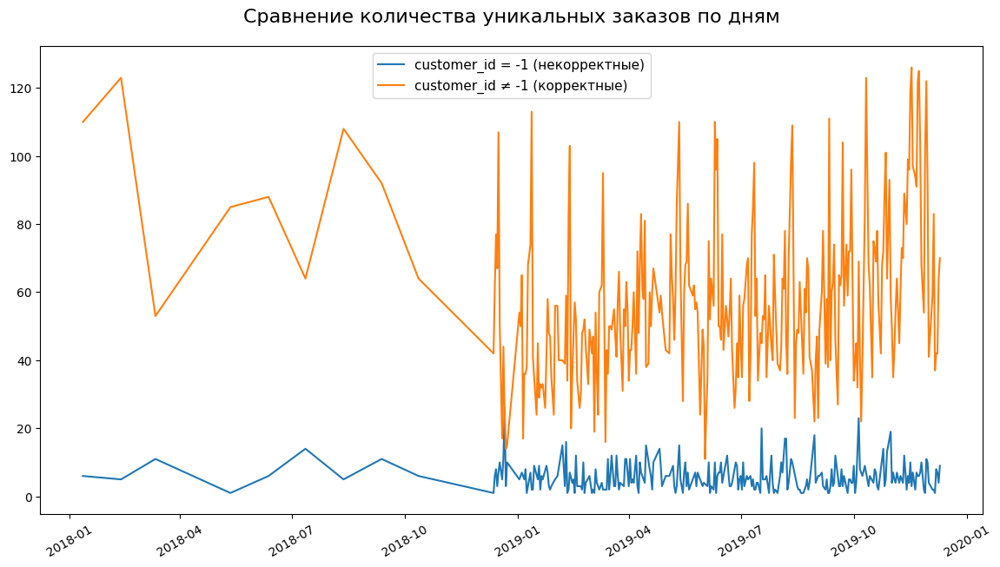

In [52]:
plt.figure(figsize=(14, 7))
plt.plot(df_gift_plot_wrong_cid['date'] ,df_gift_plot_wrong_cid['count_order'], label='customer_id = -1 (некорректные)' )
plt.plot(df_gift_plot_ok_cid['date'] ,df_gift_plot_ok_cid['count_order'] , label='customer_id ≠ -1 (корректные)')
plt.xticks(rotation = 30)
plt.title('Сравнение количества уникальных заказов по дням', fontsize=16, pad=20)
plt.legend(fontsize=11)
plt.show()

зависимости от даты не выявили

может есть зависимость от времени суток

In [53]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона


In [54]:
df_gift_plot_wrong_cid_time = df_gift.query('customer_id == -1').groupby('time').agg(count_order = ('order_id','nunique')).reset_index()
display(df_gift_plot_wrong_cid.head(2))
df_gift_plot_ok_cid_time = df_gift.query('customer_id != -1').groupby('time').agg(count_order = ('order_id','nunique')).reset_index()
display(df_gift_plot_ok_cid.head(2))

,date,count_order
0,2018-01-12,6
1,2018-02-12,5


,date,count_order
0,2018-01-12,110
1,2018-02-12,123


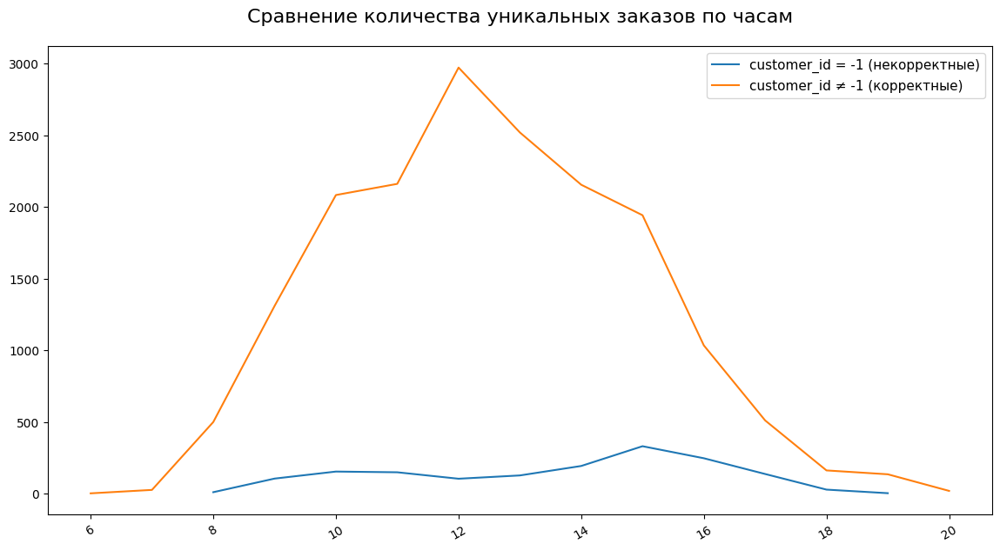

In [55]:
plt.figure(figsize=(14, 7))
plt.plot(df_gift_plot_wrong_cid_time['time'] ,df_gift_plot_wrong_cid_time['count_order'], label='customer_id = -1 (некорректные)' )
plt.plot(df_gift_plot_ok_cid_time['time'] ,df_gift_plot_ok_cid_time['count_order'] , label='customer_id ≠ -1 (корректные)')
plt.xticks(rotation = 30)
plt.title('Сравнение количества уникальных заказов по часам', fontsize=16, pad=20)
plt.legend(fontsize=11)
plt.show()

ошибки начинаются с 8 до 19  время, когда заказов становится больше, нагрузка растет, может быть сбои, передадим информацию инженерам
удалять данные с customer_id = -1 не будет , тк это 8% заказов и 25% строк, заменить id тоже не получится, тк наверняка мы его не знаем

зависит ли от типа товара (name_clust)

In [56]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона


In [57]:
df_gift['name_clust'].nunique()

907

In [58]:
df_gift_clust_wrong_cid = df_gift.query('customer_id == -1')\
       .groupby(['name_clust'])\
       .agg(count = ('customer_id','count'))\
       .sort_values(by = 'count', ascending = False).reset_index()
df_gift_clust_wrong_cid.head(10)

,name_clust,count
0,427,1708
1,415,1295
2,0,993
3,898,771
4,852,758
5,872,740
6,516,687
7,515,665
8,844,655
9,416,650


In [59]:
df_gift_clust_ok_cid = df_gift.query('customer_id != -1')\
       .groupby(['name_clust'])\
       .agg(count = ('customer_id','count'))\
       .sort_values(by = 'count', ascending = False).reset_index()
df_gift_clust_ok_cid.head(10)

,name_clust,count
0,427,5321
1,415,3692
2,516,3604
3,223,2844
4,852,2770
5,898,2316
6,726,1979
7,87,1963
8,102,1833
9,822,1633


In [60]:
df_gift_clust_result = pd.merge(df_gift_clust_ok_cid, df_gift_clust_wrong_cid, on = 'name_clust', how = 'outer')\
                         .rename(columns={'count_x': 'count_ok_cid', 'count_y': 'count_wrong_cid'})
df_gift_clust_result

,name_clust,count_ok_cid,count_wrong_cid
0,0,318.0,993.0
1,1,1056.0,28.0
2,2,3.0,NaN
3,3,48.0,22.0
4,7,566.0,182.0
...,...,...,...
902,925,10.0,33.0
903,926,309.0,88.0
904,927,619.0,140.0
905,928,145.0,85.0


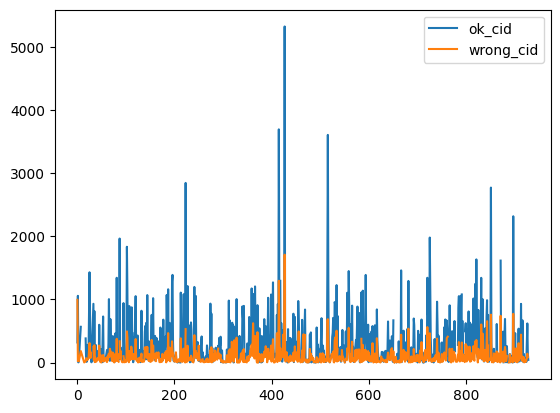

In [61]:
plt.plot(df_gift_clust_result['name_clust'], df_gift_clust_result['count_ok_cid'], label = 'ok_cid')
plt.plot(df_gift_clust_result['name_clust'], df_gift_clust_result['count_wrong_cid'], label = 'wrong_cid')
plt.legend()
plt.show()

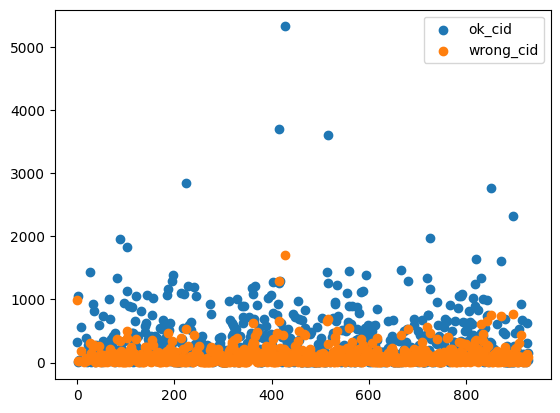

In [62]:
plt.scatter(df_gift_clust_result['name_clust'], df_gift_clust_result['count_ok_cid'], label = 'ok_cid')
plt.scatter(df_gift_clust_result['name_clust'], df_gift_clust_result['count_wrong_cid'], label = 'wrong_cid')
plt.legend()
plt.show()

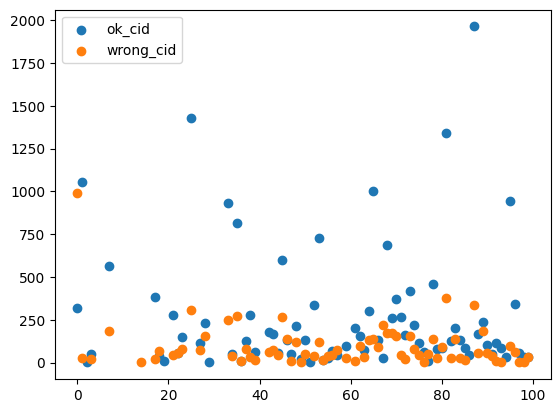

In [63]:
filtered_data = df_gift_clust_result[df_gift_clust_result['name_clust'] < 100]
plt.scatter(filtered_data['name_clust'], filtered_data['count_ok_cid'], label = 'ok_cid')
plt.scatter(filtered_data['name_clust'], filtered_data['count_wrong_cid'], label = 'wrong_cid')
plt.legend()
plt.show()

видно что при name_clust = 0 значений с customer_id = -1 больше

In [64]:
df_gift.head()

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона
2,2018-01-12 08:26:00,3031,2150,6,339,197,166,28,2018-01-12,8,вязаная грелка с флагом союза
3,2018-01-12 08:26:00,3031,2150,2,765,767,1810,28,2018-01-12,8,набор 7 скворечников для бабушек
4,2018-01-12 08:26:00,3031,2150,6,425,383,2585,28,2018-01-12,8,стеклянный матовый держатель в форме звезды


In [65]:
df_gift.query('name_clust == 0')['entry'].unique()

array(['дотком, почтовые расходы', 'руководство',
       'открытие банковского счета', 'маркет', 'дотком, продажи',
       'продажи на маркете', 'найденный', 'обратное сторно 21.03.2019',
       'заплесневевший, выброшенный.',
       'алло, это джеки, я всё посчитал, ухожу домой', 'дотком',
       'путаница с этикетками', 'выброшенный',
       'неправильно сделал-выкинул.', 'корректирование', 'доткомы наборы',
       'маркет продал наборы', 'дотком, продажа наборов',
       'неправильно проданные наборы', 'продаются наборами',
       'выброшенный.', 'ошибочно продан', 'проблема со штрих-кодом',
       'выбросил-не могу продать.', 'выбросил-не могу продать',
       'дотком температура', 'доткома быстрое решение',
       'дотком, долговременные продажи', 'продается в комплекте',
       'продан как другой', 'кредитная ошибка продавца', 'образцы',
       'алла, я сделал кредит и не поставил галочку возврата',
       'отсутствующий', 'вернулся', 'неверный код', 'регулировка',
       'списан

есть странные товары 

In [66]:
df_gift.query('name_clust == 1')['entry'].unique()

array(['почтовые расходы', 'стоимость упаковки', 'джон льюис'],
      dtype=object)

In [67]:
for i in range(25):
    print(df_gift.query('name_clust == @i')['entry'].unique())

['дотком, почтовые расходы' 'руководство' 'открытие банковского счета'
 'маркет' 'дотком, продажи' 'продажи на маркете' 'найденный'
 'обратное сторно 21.03.2019' 'заплесневевший, выброшенный.'
 'алло, это джеки, я всё посчитал, ухожу домой' 'дотком'
 'путаница с этикетками' 'выброшенный' 'неправильно сделал-выкинул.'
 'корректирование' 'доткомы наборы' 'маркет продал наборы'
 'дотком, продажа наборов' 'неправильно проданные наборы'
 'продаются наборами' 'выброшенный.' 'ошибочно продан'
 'проблема со штрих-кодом' 'выбросил-не могу продать.'
 'выбросил-не могу продать' 'дотком температура' 'доткома быстрое решение'
 'дотком, долговременные продажи' 'продается в комплекте'
 'продан как другой' 'кредитная ошибка продавца' 'образцы'
 'алла, я сделал кредит и не поставил галочку возврата' 'отсутствующий'
 'вернулся' 'неверный код' 'регулировка' 'списано, раздавлено'
 'списано, повреждения/выставочный зал и т.д.'
 'это надо отправить по почте' 'выбросил-ржавый'
 'продается в комплекте/6 от до

name_clust = 0 name_clust = 1 есть странные названия товаров

In [68]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона


In [69]:
df_gift.query('name_clust == 0').groupby(['entry_id','entry']).agg(count = ('customer_id','count')).reset_index()

,entry_id,entry,count
0,66,акции зачислены ошибочно,1
1,67,"алла, я сделал кредит и не поставил галочку во...",1
2,68,"алло, это джеки, не могу изменить этот раздел",1
3,69,"алло, это джеки, я всё посчитал, ухожу домой",2
4,70,"анна, нужно сегодня распределить запасы по зак...",1
...,...,...,...
97,668,"списано, с дырками",1
98,748,тест,3
99,827,это надо отправить по почте,4
100,1548,корректировка безнадежный долг,3


In [70]:
df_gift.query('entry_id in [67, 68, 70, 83, 84, 127, 174, 175, 176, 177,178,246,249,250,310]')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
42109,2019-01-20 15:42:00,8353,-1,-300,0,0,176,28,2019-01-20,15,дотком
72261,2019-07-03 15:18:00,12541,-1,34,0,0,249,28,2019-07-03,15,корректирование
85585,2019-03-24 17:51:00,14370,-1,100,0,0,178,28,2019-03-24,17,дотком температура
103545,2019-04-18 13:18:00,17126,-1,1300,0,0,67,28,2019-04-18,13,"алла, я сделал кредит и не поставил галочку во..."
107657,2019-04-21 15:55:00,17613,-1,3,0,0,249,28,2019-04-21,15,корректирование
107658,2019-04-21 15:56:00,17614,-1,14,0,0,249,28,2019-04-21,15,корректирование
107663,2019-04-21 16:15:00,17617,-1,2,0,0,127,28,2019-04-21,16,вернулся
107664,2019-04-21 16:16:00,17618,-1,2,0,0,127,28,2019-04-21,16,вернулся
109778,2019-04-27 11:48:00,17906,-1,41,0,0,249,28,2019-04-27,11,корректирование
110314,2019-04-27 14:56:00,17970,-1,2,0,0,249,28,2019-04-27,14,корректирование


In [71]:
# удаляем строки с entry_id in [67, 68, 70, 83, 84, 127, 174, 175, 176, 177,178,246,249,250,310]
df_gift = df_gift.query('entry_id not in [67, 68, 70, 83, 84, 127, 174, 175, 176, 177,178,246,249,250,310]')

In [72]:
df_gift.query('entry_id in [375, 376,380]')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
24961,2018-12-20 14:33:00,6277,-1,53,0,0,375,28,2018-12-20,14,найденный
33264,2019-10-01 16:04:00,7339,-1,144,0,0,375,28,2019-10-01,16,найденный
33265,2019-10-01 16:05:00,7340,-1,26,0,0,375,28,2019-10-01,16,найденный
33266,2019-10-01 16:05:00,7341,-1,40,0,0,375,28,2019-10-01,16,найденный
85422,2019-03-24 13:57:00,14339,-1,13,0,0,375,28,2019-03-24,13,найденный
107662,2019-04-21 16:14:00,17616,-1,84,0,0,375,28,2019-04-21,16,найденный
110349,2019-04-27 15:47:00,17990,-1,13,0,0,375,28,2019-04-27,15,найденный
132473,2019-05-25 09:57:00,21216,-1,1300,0,0,380,28,2019-05-25,9,неправильно зачислен
132480,2019-05-25 09:59:00,21219,-1,-1300,0,0,380,28,2019-05-25,9,неправильно зачислен
157666,2019-06-27 16:28:00,24911,-1,8,0,0,375,28,2019-06-27,16,найденный


In [73]:
# удаляем строки с entry_id in [375, 376,380]
df_gift = df_gift.query('entry_id not in [375, 376,380]')

In [74]:
df_gift.query('entry_id in [382,383,388, 496, 497,660,748,827]')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
75832,2019-11-03 16:25:00,13074,-1,170,0,0,497,28,2019-11-03,16,ошибочно продан
115053,2019-06-05 13:25:00,18841,-1,100,0,0,827,28,2019-06-05,13,это надо отправить по почте
115072,2019-06-05 13:28:00,18843,-1,100,0,0,827,28,2019-06-05,13,это надо отправить по почте
115073,2019-06-05 13:29:00,18844,-1,100,0,0,827,28,2019-06-05,13,это надо отправить по почте
115171,2019-06-05 13:59:00,18853,-1,100,0,0,827,28,2019-06-05,13,это надо отправить по почте
217776,2019-08-09 15:53:00,32730,-1,1,0,0,748,28,2019-08-09,15,тест
222115,2019-09-13 13:10:00,33239,-1,-22,0,0,748,28,2019-09-13,13,тест
222116,2019-09-13 13:14:00,33240,-1,22,0,0,748,28,2019-09-13,13,тест
227206,2019-09-19 10:28:00,33867,-1,110,0,0,660,28,2019-09-19,10,сайт исправлен
249329,2019-06-10 12:38:00,36497,-1,-800,0,0,388,28,2019-06-10,12,неправильный код


In [75]:
# удаляем строки с entry_id in [382,383,388, 496, 497,660,748,827]
df_gift = df_gift.query('entry_id not in [382,383,388, 496, 497,660,748,827]')

### quantity

имеет отрицательные значения

In [76]:
df_gift['quantity'].unique()

array([    6,     8,     2,     3,    24,    12,    48,    18,    20,
          36,     4,    32,    10,   120,    23,     5,     1,    50,
         100,   192,   432,   144,   288,    96,     9,   128,    25,
          30,    28,    72,    16,   200,   600,    14,    40,    11,
           7,    13,    70,   252,    60,   216,    27,    15,    22,
          17,    47,    52,   108,    75,   270,    64,   240,    90,
         204,    69,  1400,    19,    39,    26,    21,    31,    82,
          97,    33,    98,    80,   720,   156,   480,    38,    37,
          49,    95,    41,    42,    34,    29,   150,   300,    54,
         104,   258,    35,    55,    56,    61,   408,   972,  1008,
         384,    46,  1000,  1488,   250,  1394,   400,   110,    78,
        -100,   272,   113,    45,   267,    65,    76,   213,    58,
         576,    84,  2400,   180,   960,  1296,    44,    43,   172,
          57,    79,   129,   138,   135,   160,   147,   168,   256,
          71, -2600,

In [77]:
df_gift.query('quantity < 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
14311,2018-09-12 17:25:00,4827,-1,-100,0,0,182,28,2018-09-12,17,"дотком, продажи"
14312,2018-09-12 17:25:00,4828,-1,-100,0,0,182,28,2018-09-12,17,"дотком, продажи"
27246,2019-04-01 11:13:00,6676,-1,-100,0,0,492,28,2019-04-01,11,обратное сторно 21.03.2019
27247,2019-04-01 11:14:00,6678,-1,-100,0,0,492,28,2019-04-01,11,обратное сторно 21.03.2019
32673,2019-10-01 10:36:00,7230,-1,-2600,0,0,225,28,2019-10-01,10,"заплесневевший, выброшенный."
...,...,...,...,...,...,...,...,...,...,...,...
334448,2019-11-29 13:04:00,46095,-1,-98,0,0,526,28,2019-11-29,13,потеряно в космосе
349428,2019-06-12 16:54:00,47656,-1,-48,0,0,128,28,2019-06-12,16,влажный
349429,2019-06-12 16:55:00,47657,-1,-288,0,0,311,28,2019-06-12,16,мокрые коробки
352086,2019-08-12 09:56:00,47892,-1,-338,0,0,495,28,2019-08-12,9,отсутствующий


In [78]:
df_gift.query('quantity == 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry


In [79]:
# 0.03 % - 126 строк с 'quantity < 0'
len(df_gift.query('quantity < 0'))/len(df_gift)

0.0003264543400134522

In [80]:
df_gift.query('quantity < 0')['customer_id'].unique()

array([-1])

In [81]:
df_gift.query('quantity < 0')['price'].unique()

array([0])

In [82]:
df_gift.query('quantity < 0')['name_clust'].unique()

array([0])

если quantity < 0 то  customer_id == -1 и price == 0 и name_clust == 0 

учитывая, что строк с с 'quantity < 0' 0.03 % и в них если quantity < 0 то  то можно удалить эти строки

In [83]:
df_gift = df_gift.query('quantity > 0')

In [84]:
df_gift.query('quantity < 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry


посмотрим выбросы

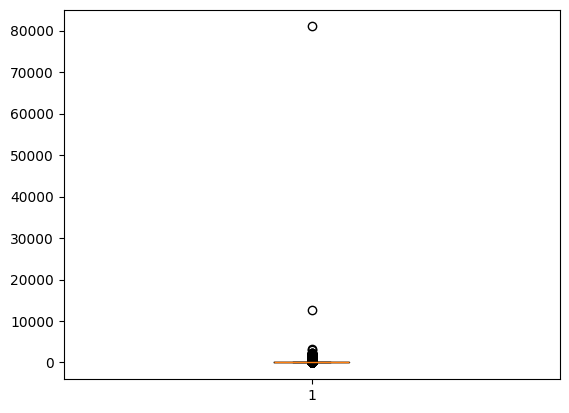

In [85]:
plt.boxplot(df_gift['quantity'])
plt.show()

In [86]:
df_gift[df_gift['quantity'] > 80000]

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
354393,2019-09-12 09:15:00,48149,3554,80995,208,325,2204,28,2019-09-12,9,"поделка из бумаги, маленькая птичка"


In [87]:
df_gift.query('order_id == 48149')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
354393,2019-09-12 09:15:00,48149,3554,80995,208,325,2204,28,2019-09-12,9,"поделка из бумаги, маленькая птичка"


In [88]:
df_gift.query('customer_id == 3554')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
126247,2019-05-18 09:52:00,20239,3554,1,165,81,2889,28,2019-05-18,9,щетка для чистки кладовой
126248,2019-05-18 09:52:00,20239,3554,1,125,81,1417,28,2019-05-18,9,кисть для кондитерских изделий
354393,2019-09-12 09:15:00,48149,3554,80995,208,325,2204,28,2019-09-12,9,"поделка из бумаги, маленькая птичка"


In [89]:
df_gift_entry.query('entry_id == 2204')

,entry_id,entry
2204,2204,"поделка из бумаги, маленькая птичка"


In [90]:
df_gift.query('entry_id == 2204')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
354393,2019-09-12 09:15:00,48149,3554,80995,208,325,2204,28,2019-09-12,9,"поделка из бумаги, маленькая птичка"


тк клиент заказывал только 3 раза, не является оптовым заказчиком судя по данным, то можно удалить этот выброс

In [91]:
df_gift = df_gift.query('quantity < 80000')

In [92]:
df_gift[df_gift['quantity'] > 80000]

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry


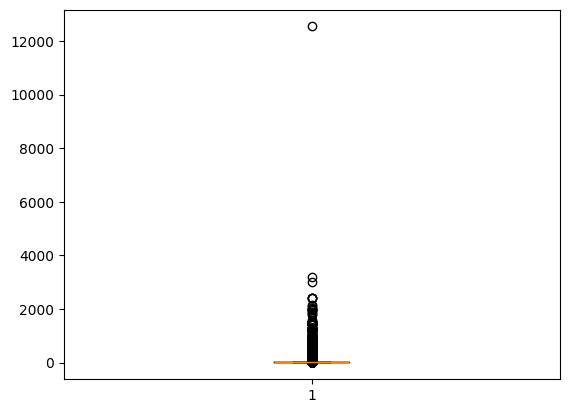

In [93]:
plt.boxplot(df_gift['quantity'])
plt.show()

In [94]:
df_gift[df_gift['quantity'] > 12000]

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
329129,2019-11-25 15:57:00,45507,6744,12540,0,549,1248,28,2019-11-25,15,"дизайн 3d бумажные наклейки, в асс"


In [95]:
df_gift.query('order_id == 45507')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
329129,2019-11-25 15:57:00,45507,6744,12540,0,549,1248,28,2019-11-25,15,"дизайн 3d бумажные наклейки, в асс"


In [96]:
df_gift.query('customer_id == 6744')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
329129,2019-11-25 15:57:00,45507,6744,12540,0,549,1248,28,2019-11-25,15,"дизайн 3d бумажные наклейки, в асс"


In [97]:
df_gift.query('entry_id == 1248')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
2144,2018-02-12 10:27:00,3286,5865,60,85,549,1248,28,2018-02-12,10,"дизайн 3d бумажные наклейки, в асс"
18901,2018-12-14 11:51:00,5467,3917,60,21,549,1248,28,2018-12-14,11,"дизайн 3d бумажные наклейки, в асс"
19482,2018-12-14 14:54:00,5536,7171,60,21,549,1248,28,2018-12-14,14,"дизайн 3d бумажные наклейки, в асс"
19860,2018-12-15 09:07:00,5561,5599,60,21,549,1248,28,2018-12-15,9,"дизайн 3d бумажные наклейки, в асс"
20430,2018-12-15 14:45:00,5704,4359,60,21,549,1248,28,2018-12-15,14,"дизайн 3d бумажные наклейки, в асс"
20605,2018-12-15 16:21:00,5716,7423,2,85,549,1248,5,2018-12-15,16,"дизайн 3d бумажные наклейки, в асс"
24060,2018-12-19 14:23:00,6138,4419,1,85,549,1248,28,2018-12-19,14,"дизайн 3d бумажные наклейки, в асс"
24062,2018-12-19 14:23:00,6138,4419,1,85,549,1248,28,2018-12-19,14,"дизайн 3d бумажные наклейки, в асс"
24066,2018-12-19 14:23:00,6138,4419,2,85,549,1248,28,2018-12-19,14,"дизайн 3d бумажные наклейки, в асс"
26378,2018-12-22 10:29:00,6427,2407,60,21,549,1248,28,2018-12-22,10,"дизайн 3d бумажные наклейки, в асс"


In [98]:
df_gift_entry.query('entry_id == 1248')

,entry_id,entry
1248,1248,"дизайн 3d бумажные наклейки, в асс"


тк клиент заказывал только 1 раз, не является оптовым заказчиком судя по данным, то можно удалить этот выброс

In [99]:
df_gift = df_gift.query('quantity < 12000')

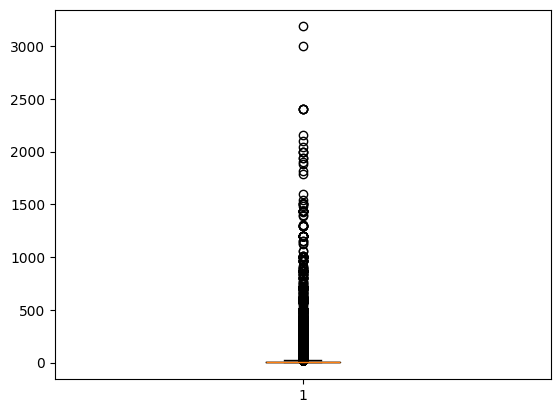

In [100]:
plt.boxplot(df_gift['quantity'])
plt.show()

In [101]:
df_gift.query('quantity > 2500')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
176919,2019-07-19 17:04:00,27265,5391,3186,6,223,832,28,2019-07-19,17,"эфирный бальзам 3,5г банка в конверте"
283859,2019-02-11 11:24:00,40661,3692,3000,32,608,1720,28,2019-02-11,11,маленькие ножницы в китайском стиле


In [102]:
# выброс с customer_id == 1 price == 0 - можно удалить
display(df_gift.query('order_id==26706'))
display(df_gift.query('entry_id==246'))
display(df_gift_entry.query('entry_id==246'))

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry


,entry_id,entry
246,246,код красный


In [103]:
df_gift = df_gift.query('order_id !=  26706')

In [104]:
# не удаляем выброс
display(df_gift.query('order_id==27265'))
display(df_gift.query('customer_id==5391')) # вссегда закупал большими партиями
display(df_gift.query('entry_id==832').head())
display(df_gift_entry.query('entry_id==832'))

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
176919,2019-07-19 17:04:00,27265,5391,3186,6,223,832,28,2019-07-19,17,"эфирный бальзам 3,5г банка в конверте"


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
58988,2019-02-16 12:10:00,10818,5391,2400,6,223,832,28,2019-02-16,12,"эфирный бальзам 3,5г банка в конверте"
147978,2019-06-15 09:33:00,23483,5391,720,21,294,2106,28,2019-06-15,9,парчовый кошелек с кольцом
176919,2019-07-19 17:04:00,27265,5391,3186,6,223,832,28,2019-07-19,17,"эфирный бальзам 3,5г банка в конверте"
238689,2019-09-28 12:54:00,35332,5391,720,16,294,2106,28,2019-09-28,12,парчовый кошелек с кольцом


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
7368,2018-06-12 10:18:00,3907,5707,24,18,223,832,28,2018-06-12,10,"эфирный бальзам 3,5г банка в конверте"
7691,2018-06-12 12:23:00,4017,3102,1,18,223,832,28,2018-06-12,12,"эфирный бальзам 3,5г банка в конверте"
8953,2018-06-12 16:57:00,4100,-1,1,43,223,832,28,2018-06-12,16,"эфирный бальзам 3,5г банка в конверте"
13311,2018-09-12 14:09:00,4737,-1,1,43,223,832,28,2018-09-12,14,"эфирный бальзам 3,5г банка в конверте"
20985,2018-12-16 11:53:00,5851,3530,20,18,223,832,28,2018-12-16,11,"эфирный бальзам 3,5г банка в конверте"


,entry_id,entry
832,832,"эфирный бальзам 3,5г банка в конверте"


In [105]:
# не удаляем выброс
display(df_gift.query('order_id==40661'))
display(df_gift.query('customer_id==3692')) # вссегда закупал большими партиями
display(df_gift.query('entry_id==1720').head())
display(df_gift_entry.query('entry_id==1720'))

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
283859,2019-02-11 11:24:00,40661,3692,3000,32,608,1720,28,2019-02-11,11,маленькие ножницы в китайском стиле


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
84328,2019-03-23 14:46:00,14185,3692,1000,32,608,1720,28,2019-03-23,14,маленькие ножницы в китайском стиле
115051,2019-06-05 13:03:00,18838,3692,2000,32,608,1720,28,2019-06-05,13,маленькие ножницы в китайском стиле
203769,2019-08-24 10:52:00,30938,3692,2000,32,608,1720,28,2019-08-24,10,маленькие ножницы в китайском стиле
283859,2019-02-11 11:24:00,40661,3692,3000,32,608,1720,28,2019-02-11,11,маленькие ножницы в китайском стиле


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
484,2018-01-12 12:15:00,3112,4017,10,42,608,1720,28,2018-01-12,12,маленькие ножницы в китайском стиле
6023,2018-05-12 14:17:00,3866,4133,4,42,608,1720,28,2018-05-12,14,маленькие ножницы в китайском стиле
12381,2018-08-12 15:10:00,4507,6152,1000,32,608,1720,28,2018-08-12,15,маленькие ножницы в китайском стиле
13760,2018-09-12 14:10:00,4739,2184,1,42,608,1720,28,2018-09-12,14,маленькие ножницы в китайском стиле
18354,2018-12-13 15:12:00,5318,2110,4,42,608,1720,28,2018-12-13,15,маленькие ножницы в китайском стиле


,entry_id,entry
1720,1720,маленькие ножницы в китайском стиле


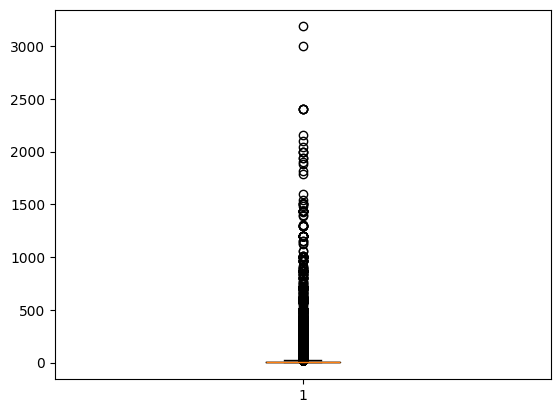

In [106]:
plt.boxplot(df_gift['quantity'])
plt.show()

остальные выбросы оставим, тк это возможные значения оптовых клиентов

### price

имеет отрицательные и нулевые значения

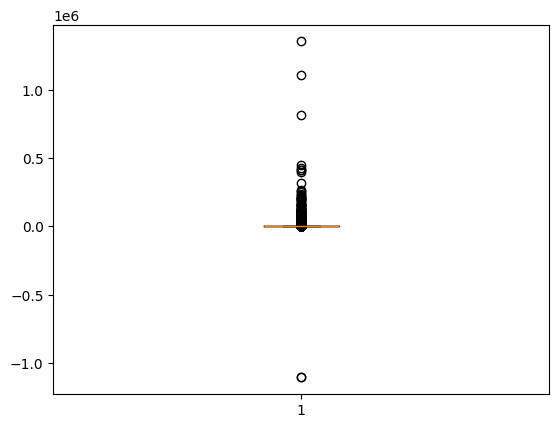

In [107]:
plt.boxplot(df_gift['price'])
plt.show()

In [108]:
df_gift.query('price < 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
196142,2019-12-08 14:51:00,29852,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196143,2019-12-08 14:52:00,29853,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг


In [109]:
display(df_gift.query('order_id==29852'))
display(df_gift.query('order_id==29853'))

display(df_gift.query('entry_id==1548'))
display(df_gift_entry.query('entry_id==1548'))

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
196142,2019-12-08 14:51:00,29852,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
196143,2019-12-08 14:52:00,29853,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
196141,2019-12-08 14:50:00,29851,-1,1,1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196142,2019-12-08 14:51:00,29852,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196143,2019-12-08 14:52:00,29853,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг


,entry_id,entry
1548,1548,корректировка безнадежный долг


странное наименование товара

In [110]:
# проверили нет ли одинаковых странных названи товаров для customer_id==-1
df_gift.query('customer_id==-1')['entry_id'].nunique()

2387

In [111]:
df_gift_entry['entry'].str.contains('долг').sum()

np.int64(2)

In [112]:
df_gift_entry.query('entry == "%долг%"')

,entry_id,entry


In [113]:
result = df_gift_entry.query('entry.str.contains("долг", na=False)')
display(result)

,entry_id,entry
179,179,"дотком, долговременные продажи"
1548,1548,корректировка безнадежный долг


In [114]:
df_gift.query('entry_id == 179 or entry_id == 1548')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
196141,2019-12-08 14:50:00,29851,-1,1,1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196142,2019-12-08 14:51:00,29852,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196143,2019-12-08 14:52:00,29853,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг


In [115]:
df_gift.query('order_id == 29851 or order_id == 29852 or order_id==29853')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
196141,2019-12-08 14:50:00,29851,-1,1,1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196142,2019-12-08 14:51:00,29852,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг
196143,2019-12-08 14:52:00,29853,-1,1,-1106206,0,1548,28,2019-12-08,14,корректировка безнадежный долг


entry_id==1548 - корректировка безнадежный долг \
customer_id = -1 \
price = 1106206/-1106206 - аномальные значения\
date = 2019-12-08
order_id = 29851 29852 29853

данные заказы можно удалить, тк наименование товара неспицифично, customer_id ==-1 price = 1106206/-1106206 - аномальные значения

In [116]:
df_gift = df_gift.query('entry_id != 1548')

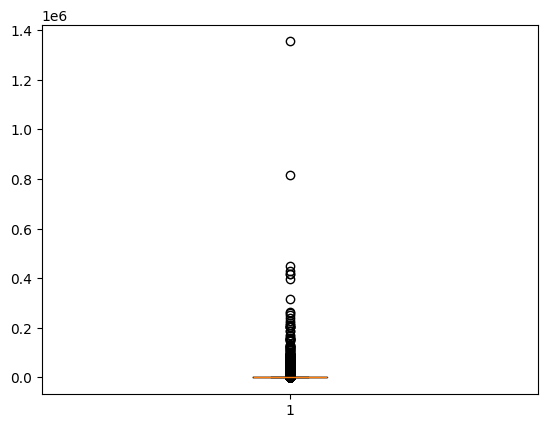

In [117]:
plt.boxplot(df_gift['price'])
plt.show()

разберем аномально высокие значения

In [118]:
df_gift.query('price > 1000000')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
9631,2018-07-12 15:08:00,4298,-1,1,1354133,14,1493,28,2018-07-12,15,комиссия амазон


In [119]:
display(df_gift.query('entry_id == 1493'))
display(df_gift.query('order_id == 4298'))
display(df_gift_entry.query('entry_id == 1493'))

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
9631,2018-07-12 15:08:00,4298,-1,1,1354133,14,1493,28,2018-07-12,15,комиссия амазон
87283,2019-03-28 11:57:00,14567,-1,1,21976,14,1493,28,2019-03-28,11,комиссия амазон


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
9631,2018-07-12 15:08:00,4298,-1,1,1354133,14,1493,28,2018-07-12,15,комиссия амазон


,entry_id,entry
1493,1493,комиссия амазон


по данному товару 2 записи, но тк это комиссия, то мы неможем продублировать цену меньшей записи, полагаем, что комиссия не может быть такой большой, клиент не известен, поэтому удалим запись

In [120]:
df_gift = df_gift.query('order_id!=4298')

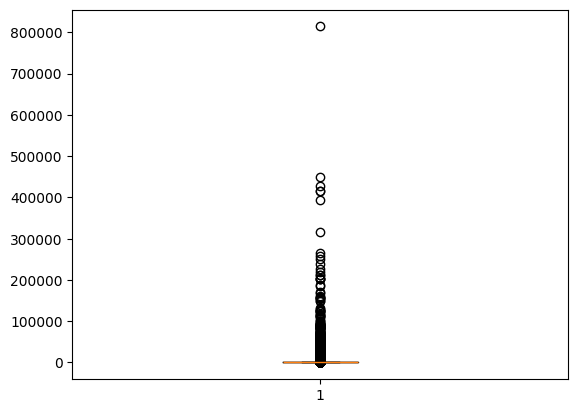

In [121]:
plt.boxplot(df_gift['price'])
plt.show()

In [122]:
df_gift.query('price > 800000')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
112159,2019-03-05 13:46:00,18363,3971,1,814275,1,2253,28,2019-03-05,13,почтовые расходы


In [123]:
display(df_gift.query('order_id == 18363'))
display(df_gift.query('customer_id == 3971')) # постоянные покупатель оптовый
display(df_gift.query('entry_id == 2253'))  # частый товар для покупки
display(df_gift.query('entry_id == 2253')['price'].mean())  # 3053 средний раcход
display(df_gift_entry.query('entry_id == 2253')) # почтовые расходы

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
112159,2019-03-05 13:46:00,18363,3971,1,814275,1,2253,28,2019-03-05,13,почтовые расходы


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
117,2018-01-12 09:57:00,3052,3971,36,495,732,1233,28,2018-01-12,9,держатель для яиц из белой проволоки
118,2018-01-12 09:57:00,3052,3971,100,165,427,957,28,2018-01-12,9,большая сумка красного цвета retrospot
119,2018-01-12 09:58:00,3053,3971,192,337,885,295,28,2018-01-12,9,легкая гирлянда из розовых бабочек
120,2018-01-12 09:58:00,3053,3971,432,125,323,285,28,2018-01-12,9,красный поганок светодиодный ночник
3178,2018-02-12 17:40:00,3497,3971,12,495,732,1233,28,2018-02-12,17,держатель для яиц из белой проволоки
...,...,...,...,...,...,...,...,...,...,...,...
255699,2019-11-10 11:15:00,37223,3971,720,255,52,1647,28,2019-11-10,11,кукла молли из фетра
274852,2019-10-26 13:34:00,39544,3971,78,166,213,2119,28,2019-10-26,13,передать шоколадный знак
282642,2019-01-11 10:27:00,40440,3971,50,145,516,2605,28,2019-01-11,10,сумка для обеда с дизайном яблока
282643,2019-01-11 10:27:00,40440,3971,100,174,416,1145,28,2019-01-11,10,гигантская сумка для хранения suki


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
32,2018-01-12 08:45:00,3036,7417,3,1800,1,2253,5,2018-01-12,8,почтовые расходы
240,2018-01-12 11:27:00,3069,7209,1,1500,1,2253,16,2018-01-12,11,почтовые расходы
724,2018-01-12 13:04:00,3193,7338,1,1800,1,2253,6,2018-01-12,13,почтовые расходы
3262,2018-02-12 18:27:00,3506,7262,1,1800,1,2253,6,2018-02-12,18,почтовые расходы
3376,2018-03-12 09:51:00,3518,7314,1,1800,1,2253,5,2018-03-12,9,почтовые расходы
...,...,...,...,...,...,...,...,...,...,...,...
354933,2019-09-12 10:10:00,48159,7577,1,1500,1,2253,3,2019-09-12,10,почтовые расходы
354947,2019-09-12 10:13:00,48160,7482,2,1800,1,2253,6,2019-09-12,10,почтовые расходы
355299,2019-09-12 11:59:00,48236,7338,1,1800,1,2253,6,2019-09-12,11,почтовые расходы
355324,2019-09-12 12:09:00,48240,7474,2,1800,1,2253,6,2019-09-12,12,почтовые расходы


np.float64(3053.6719626168224)

,entry_id,entry
2253,2253,почтовые расходы


не будем удалять выброс, тк покупатель оптовый, у него возможен данный почтовый расход

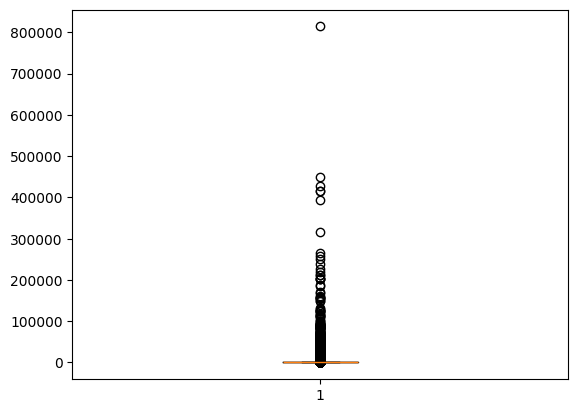

In [124]:
plt.boxplot(df_gift['price'])
plt.show()

In [125]:
df_gift.query('price < 800000 and price > 300000')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
175138,2019-07-18 12:30:00,27039,-1,1,428763,0,2375,28,2019-07-18,12,руководство
194629,2019-11-08 10:14:00,29621,-1,1,450517,0,180,28,2019-11-08,10,"дотком, почтовые расходы"
245283,2019-03-10 16:44:00,36048,4498,1,315595,0,2375,28,2019-03-10,16,руководство
265830,2019-10-19 11:18:00,38417,7256,1,394932,0,2375,22,2019-10-19,11,руководство
276312,2019-10-27 14:13:00,39743,7464,1,416106,0,2375,5,2019-10-27,14,руководство
276325,2019-10-27 14:20:00,39746,7464,1,416106,0,2375,5,2019-10-27,14,руководство


можно оставить выбросы, возможно это услуга, которая стоит дороже товара

разберем цены с нулевыми значениями

In [126]:
df_gift.query('price == 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
4120,2018-03-12 12:08:00,3607,-1,20,0,0,307,28,2018-03-12,12,маркет
4121,2018-03-12 12:08:00,3608,-1,15,0,0,307,28,2018-03-12,12,маркет
5981,2018-05-12 14:02:00,3863,7353,1,0,719,1608,6,2018-05-12,14,"круглая форма для торта, винтажная, зеленая"
9195,2018-07-12 11:48:00,4200,-1,2,0,721,1537,28,2018-07-12,11,коробка из 24 коктейльных зонтов
9196,2018-07-12 11:48:00,4200,-1,1,0,709,232,28,2018-07-12,11,зеленая чашка и блюдце в стиле регентства
...,...,...,...,...,...,...,...,...,...,...,...
342359,2019-04-12 10:37:00,47056,-1,1,0,0,307,28,2019-04-12,10,маркет
342360,2019-04-12 10:42:00,47057,-1,1,0,0,307,28,2019-04-12,10,маркет
343937,2019-05-12 11:41:00,47275,-1,1,0,0,307,28,2019-05-12,11,маркет
353101,2019-08-12 13:58:00,48072,-1,240,0,17,1981,28,2019-08-12,13,наполнитель из полиэстера 45х45см.


посмотрим детальнее на товары за 0р

In [127]:
df_gift.query('entry_id==307')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
4120,2018-03-12 12:08:00,3607,-1,20,0,0,307,28,2018-03-12,12,маркет
4121,2018-03-12 12:08:00,3608,-1,15,0,0,307,28,2018-03-12,12,маркет
10057,2018-07-12 15:29:00,4305,-1,30,0,0,307,28,2018-07-12,15,маркет
15521,2018-10-12 14:59:00,5014,-1,30,0,0,307,28,2018-10-12,14,маркет
203634,2019-08-24 10:20:00,30895,-1,20,0,0,307,28,2019-08-24,10,маркет
205919,2019-08-26 13:38:00,31311,-1,44,0,0,307,28,2019-08-26,13,маркет
225476,2019-09-16 10:15:00,33648,-1,1,0,0,307,28,2019-09-16,10,маркет
225477,2019-09-16 10:16:00,33649,-1,1,0,0,307,28,2019-09-16,10,маркет
273472,2019-10-25 14:24:00,39363,-1,6,0,0,307,28,2019-10-25,14,маркет
273473,2019-10-25 14:25:00,39364,-1,1,0,0,307,28,2019-10-25,14,маркет


In [128]:
df_gift_entry.query('entry_id==307')

,entry_id,entry
307,307,маркет


In [129]:
df_gift.query('entry_id==1608')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
1832,2018-01-12 17:06:00,3258,-1,1,1613,719,1608,28,2018-01-12,17,"круглая форма для торта, винтажная, зеленая"
2552,2018-02-12 13:06:00,3404,4173,2,795,719,1608,28,2018-02-12,13,"круглая форма для торта, винтажная, зеленая"
3284,2018-02-12 18:49:00,3510,5764,2,795,719,1608,28,2018-02-12,18,"круглая форма для торта, винтажная, зеленая"
3418,2018-03-12 10:43:00,3525,7159,1,795,719,1608,28,2018-03-12,10,"круглая форма для торта, винтажная, зеленая"
5981,2018-05-12 14:02:00,3863,7353,1,0,719,1608,6,2018-05-12,14,"круглая форма для торта, винтажная, зеленая"
...,...,...,...,...,...,...,...,...,...,...,...
338820,2019-01-12 11:43:00,46687,5953,2,795,719,1608,28,2019-01-12,11,"круглая форма для торта, винтажная, зеленая"
346487,2019-05-12 17:24:00,47395,-1,1,1579,719,1608,28,2019-05-12,17,"круглая форма для торта, винтажная, зеленая"
351259,2019-08-12 09:20:00,47883,-1,1,1579,719,1608,28,2019-08-12,9,"круглая форма для торта, винтажная, зеленая"
351570,2019-08-12 09:28:00,47885,-1,1,1579,719,1608,28,2019-08-12,9,"круглая форма для торта, винтажная, зеленая"


In [130]:
df_gift_entry.query('entry_id==1608')

,entry_id,entry
1608,1608,"круглая форма для торта, винтажная, зеленая"


In [131]:
display(df_gift.query('entry_id==1537'))
display(df_gift_entry.query('entry_id==1537'))

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
795,2018-01-12 13:24:00,3198,7567,50,42,721,1537,17,2018-01-12,13,коробка из 24 коктейльных зонтов
1170,2018-01-12 14:32:00,3210,-1,1,85,721,1537,28,2018-01-12,14,коробка из 24 коктейльных зонтов
1905,2018-01-12 17:06:00,3258,-1,3,85,721,1537,28,2018-01-12,17,коробка из 24 коктейльных зонтов
2326,2018-02-12 11:35:00,3303,1959,1,42,721,1537,28,2018-02-12,11,коробка из 24 коктейльных зонтов
2575,2018-02-12 13:14:00,3408,3084,1,42,721,1537,28,2018-02-12,13,коробка из 24 коктейльных зонтов
...,...,...,...,...,...,...,...,...,...,...,...
353077,2019-08-12 13:50:00,48071,6479,1,42,721,1537,28,2019-08-12,13,коробка из 24 коктейльных зонтов
353135,2019-08-12 14:14:00,48076,6902,25,42,721,1537,28,2019-08-12,14,коробка из 24 коктейльных зонтов
353620,2019-08-12 16:30:00,48105,-1,1,83,721,1537,28,2019-08-12,16,коробка из 24 коктейльных зонтов
354486,2019-09-12 10:03:00,48158,-1,1,83,721,1537,28,2019-09-12,10,коробка из 24 коктейльных зонтов


,entry_id,entry
1537,1537,коробка из 24 коктейльных зонтов


In [132]:
len(df_gift.query('price == 0'))/len(df_gift)

0.0009909603024681106

строк с price == 0 0.1% поэтому заменим на price == среднему или медианному значению аналоничного товара в учетом количества в других строках


In [133]:
#display(df_gift.groupby(['entry_id','quantity'])['price'].median().reset_index())
#display(df_gift.groupby(['entry_id','quantity'])['price'].mean().reset_index())

df_gift_price_median = (df_gift
                        .groupby(['entry_id','quantity'])['price']
                        .median()
                        .reset_index()
                        .rename(columns={'price': 'price_median'}))
df_gift_price_mean = (df_gift
                      .groupby(['entry_id','quantity'])['price']
                      .mean()
                      .reset_index()
                      .rename(columns={'price': 'price_mean'}))

result_price = pd.merge(df_gift_price_median, df_gift_price_mean, on = ['entry_id', 'quantity'], how = 'outer')
display(result_price)
print((result_price['price_median'] - result_price['price_mean']).sum())
print(result_price['price_median'].mean())
print(result_price['price_mean'].mean())

,entry_id,quantity,price_median,price_mean
0,1,1,163.0,157.387755
1,1,2,163.0,161.375000
2,1,3,163.0,163.833333
3,1,4,163.0,163.000000
4,1,5,85.0,85.000000
...,...,...,...,...
27223,2916,3,210.0,210.000000
27224,2916,4,210.0,210.000000
27225,2916,5,210.0,210.000000
27226,2916,6,210.0,210.000000


-226266.04681782293
267.80688996621126
276.11694016519107


медианная цена ниже, чем средняя цена, следовательно есть выбросы, заменим цену на медиану

In [134]:
df_gift_price_median_series = (df_gift
                              .groupby(['entry_id','quantity'])['price']
                               .transform('median'))

df_gift['price'] = df_gift['price'].mask(df_gift['price'] == 0, df_gift_price_median_series)

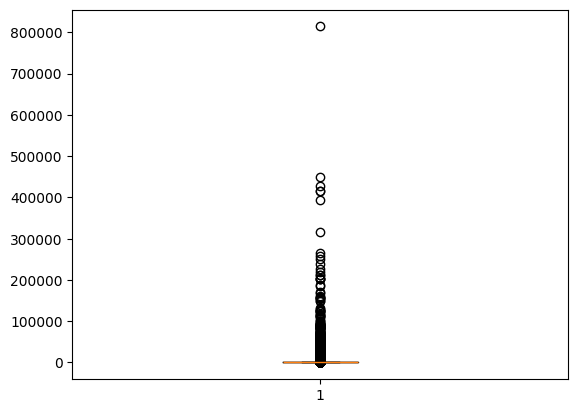

In [135]:
plt.boxplot(df_gift['price'])
plt.show()

количество 0 значений цены снизилось но не ушло полностью, оставим как есть, тк их доля очень мала

In [136]:
df_gift.query('price== 0')

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
4120,2018-03-12 12:08:00,3607,-1,20,0.0,0,307,28,2018-03-12,12,маркет
4121,2018-03-12 12:08:00,3608,-1,15,0.0,0,307,28,2018-03-12,12,маркет
9208,2018-07-12 11:48:00,4200,-1,29,0.0,608,1528,28,2018-07-12,11,корзина для пикника плетеная маленькая
10057,2018-07-12 15:29:00,4305,-1,30,0.0,0,307,28,2018-07-12,15,маркет
15521,2018-10-12 14:59:00,5014,-1,30,0.0,0,307,28,2018-10-12,14,маркет
19494,2018-12-14 15:13:00,5539,-1,20,0.0,0,531,28,2018-12-14,15,продажи на маркете
26555,2018-12-22 14:41:00,6522,-1,7,0.0,153,862,28,2018-12-22,14,банка для печенья kings choice
67383,2019-02-28 14:19:00,11842,-1,3,0.0,139,2309,28,2019-02-28,14,ретро «чай для одного»
75830,2019-11-03 16:21:00,13072,-1,70,0.0,17,1979,28,2019-11-03,16,наполнитель из полиэстера 40х40см.
75831,2019-11-03 16:21:00,13072,-1,60,0.0,17,1981,28,2019-11-03,16,наполнитель из полиэстера 45х45см.


# Исследовательский анализ 

### order_id - top заказов

In [137]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона


In [138]:
print(df_gift['order_id'].nunique())
print(df_gift['order_id'].min())
print(df_gift['order_id'].max())

18887
3031
48253


In [139]:
df_gift['sum'] = df_gift['quantity'] * df_gift['price']
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь,2034.0
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона,2200.0


In [140]:
# top заказов по стоимости
df_gift.groupby('order_id').agg(sum_order = ('sum','sum')).sort_values(by = 'sum_order', ascending = False).head(5)

,sum_order
order_id,
41607,3276594.0
43031,2877846.0
34089,2415664.0
23583,1746988.0
34047,1703504.0


In [141]:
# время когда заказы совершались с привязкой к стоимости
df_gift_sum_order = df_gift.groupby(['order_id', 'date'])\
                    .agg(sum_order = ('sum','sum'))\
                    .sort_values(by = 'sum_order', ascending = False)\
                    .reset_index()
df_gift_sum_order.head()

,order_id,date,sum_order
0,41607,2019-07-11,3276594.0
1,43031,2019-11-14,2877846.0
2,34089,2019-09-20,2415664.0
3,23583,2019-06-15,1746988.0
4,34047,2019-09-20,1703504.0


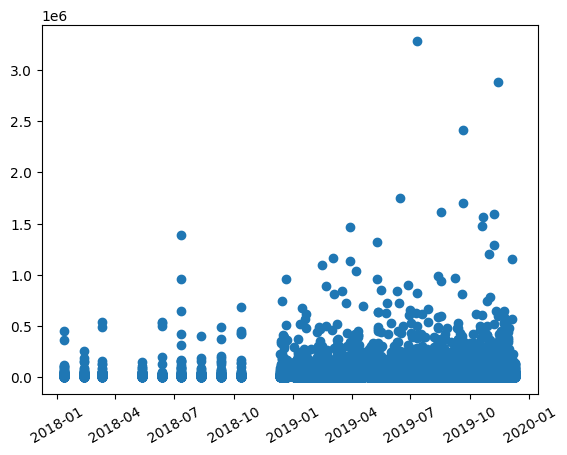

In [142]:
plt.scatter(df_gift_sum_order['date'], df_gift_sum_order['sum_order'] )
plt.xticks(rotation = 30)
plt.show()

### country_id - top стран

In [143]:
print(df_gift['country_id'].nunique())
print(df_gift['country_id'].min())
print(df_gift['country_id'].max())

30
0
29


In [144]:
# самая частая страна 28
df_gift.groupby('country_id').agg(count_order = ('order_id','nunique')).sort_values('count_order', ascending = False).head()


,count_order
country_id,
28,17363
6,455
5,389
3,98
16,92


## entry_date - top месяцев продаж

In [145]:
df_gift.head(3)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь,2034.0
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона,2200.0
2,2018-01-12 08:26:00,3031,2150,6,339.0,197,166,28,2018-01-12,8,вязаная грелка с флагом союза,2034.0


In [146]:
# Посчитайте по месяцам количество дней, в которых были продажи

df_gift['day'] = df_gift['entry_date'].dt.day
df_gift['year'] = df_gift['entry_date'].dt.year
df_gift['month'] = df_gift['entry_date'].dt.month
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь,2034.0,12,2018,1
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона,2200.0,12,2018,1


In [147]:
df_gift.groupby(['year','month']).agg(count_days_with_sale = ('day', 'nunique')).reset_index()

,year,month,count_days_with_sale
0,2018,1,1
1,2018,2,1
2,2018,3,1
3,2018,5,1
4,2018,6,1
5,2018,7,1
6,2018,8,1
7,2018,9,1
8,2018,10,1
9,2018,12,11


получается, что магазин заработал с почти ежедневными продажами с 2019г (12 месяц 2019 года брать для анализа не стоит)

## customer_id - top покупателей

In [148]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь,2034.0,12,2018,1
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона,2200.0,12,2018,1


In [149]:
df_gift.groupby('customer_id').agg(sum_price = ('sum','sum')).sort_values(by = 'sum_price', ascending = False).reset_index()

,customer_id,sum_price
0,-1,120691913.5
1,5354,20929022.0
2,1898,15964690.0
3,7585,9516815.0
4,2550,8813886.0
...,...,...
4243,3546,690.0
4244,5208,620.0
4245,3122,380.0
4246,3262,375.0


покупателя с id -1 не стоит учитывать в данном рейтинге, тк это могут быть сбои логирования

## entry_id - top_price

In [150]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь,2034.0,12,2018,1
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона,2200.0,12,2018,1


In [151]:
df_gift.groupby(['entry_id','entry'])\
    .agg(sum_prise = ('sum','sum'))\
    .sort_values(by = 'sum_prise', ascending= False)\
    .reset_index()

,entry_id,entry,sum_prise
0,180,"дотком, почтовые расходы",20661901.0
1,2223,подставка для торта regency 3 яруса,16570194.0
2,2254,праздничная овсянка,9738728.0
3,957,большая сумка красного цвета retrospot,9342845.0
4,2253,почтовые расходы,7296094.0
...,...,...,...
2822,307,маркет,0.0
2823,2234,"подушечки, подходящие ко всем подушкам",0.0
2824,374,найденная коробка,0.0
2825,389,нулевой неверный,0.0


# Расчёт метрик

Будем работать с данными с 01/2019 до 11/2019 (тк в эти месяцы идет основная активность)

In [152]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month
0,2018-01-12 08:26:00,3031,2150,6,339.0,740,891,28,2018-01-12,8,белый металлический фонарь,2034.0,12,2018,1
1,2018-01-12 08:26:00,3031,2150,8,275.0,132,1596,28,2018-01-12,8,кремовая вешалка в форме сердечек купидона,2200.0,12,2018,1


In [153]:
df_gift = df_gift.query('entry_date >= "2019-01-01 00:00:00" and entry_date < "2019-12-01 00:00:00"')

## Задача 1

Оцените по часам и дням недели количество заказов и количество уникальных покупателей. 

Постройте графики и сделайте вывод о наличии цикличности в покупательской активности.

In [154]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4


In [155]:
df_gift['day_of_week'] = df_gift['entry_date'].dt.day_name()

In [156]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


### Оцените по часам количество заказов и количество уникальных покупателей

In [157]:
# Оцените по часам количество заказов и количество уникальных покупателей.

df_gift_unique_orders_cust_per_hour = (df_gift
                                    .groupby('time')
                                    .agg(count_orders = ('order_id','nunique'), count_customers = ('customer_id','nunique'))
                                    .reset_index())
df_gift_unique_orders_cust_per_hour

,time,count_orders,count_customers
0,6,1,1
1,7,23,22
2,8,476,390
3,9,1257,803
4,10,2000,1141
5,11,2046,1175
6,12,2771,1486
7,13,2356,1432
8,14,2116,1265
9,15,1955,1158


основные часы заказа с 8 утра до 17 вечера

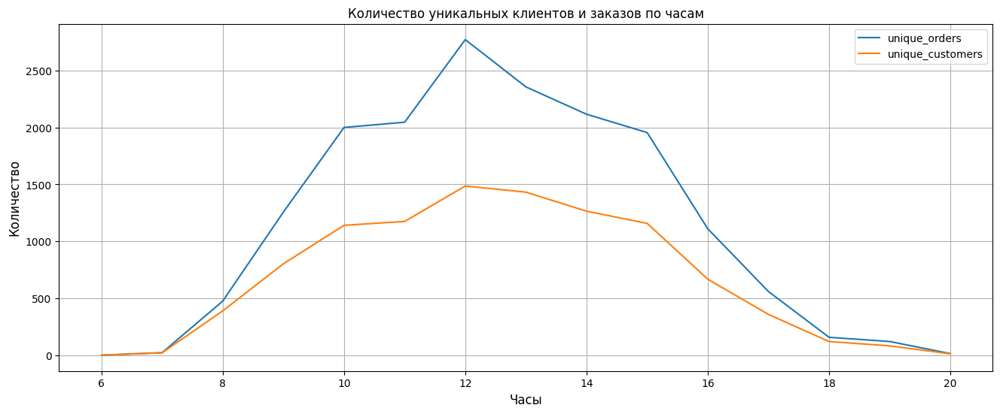

In [158]:
# построим график

plt.figure(figsize=(16, 6))
plt.plot(df_gift_unique_orders_cust_per_hour['time'], df_gift_unique_orders_cust_per_hour['count_orders'], label = 'unique_orders')
plt.plot(df_gift_unique_orders_cust_per_hour['time'], df_gift_unique_orders_cust_per_hour['count_customers'], label = 'unique_customers')
plt.legend()
plt.title('Количество уникальных клиентов и заказов по часам')
plt.xlabel('Часы', fontsize=12)
plt.ylabel('Количество', fontsize=12)
plt.grid()
plt.show()

### Оцените по дням недели количество заказов и количество уникальных покупателей.

In [159]:
# Оцените по дням недели количество заказов и количество уникальных покупателей.

df_gift.groupby('day_of_week').agg(count_orders = ('order_id','nunique'), count_customers = ('customer_id','nunique')).reset_index()

,day_of_week,count_orders,count_customers
0,Friday,2935,1546
1,Monday,2550,1456
2,Saturday,2640,1426
3,Sunday,3183,1732
4,Thursday,2495,1412
5,Tuesday,934,644
6,Wednesday,2227,1335


In [160]:
# Оцените по дням недели количество заказов и количество уникальных покупателей.
correct_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

df_gift_unique_orders_cust_per_dow = (df_gift.groupby('day_of_week')
                                            .agg(count_orders = ('order_id','nunique'), count_customers = ('customer_id','nunique'))
                                            .reset_index().sort_values(by = 'count_orders')
                                            .set_index('day_of_week')
                                            .loc[correct_order]
                                            .reset_index())
    
df_gift_unique_orders_cust_per_dow

,day_of_week,count_orders,count_customers
0,Monday,2550,1456
1,Tuesday,934,644
2,Wednesday,2227,1335
3,Thursday,2495,1412
4,Friday,2935,1546
5,Saturday,2640,1426
6,Sunday,3183,1732


дни с самым большим количеством заказов - воскресенье и понедельник
дни с наименьшими количесвом заказов - вторник

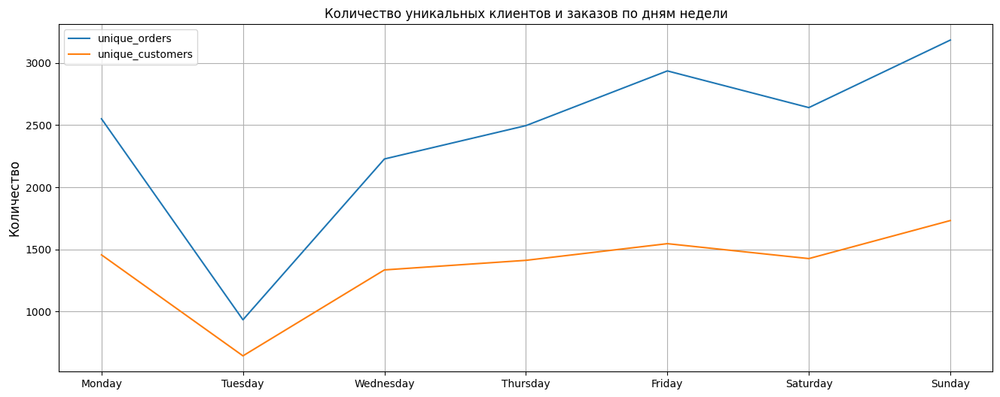

In [161]:
# построим график

plt.figure(figsize=(16, 6))
plt.plot(df_gift_unique_orders_cust_per_dow['day_of_week'], df_gift_unique_orders_cust_per_dow['count_orders'], label = 'unique_orders')
plt.plot(df_gift_unique_orders_cust_per_dow['day_of_week'], df_gift_unique_orders_cust_per_dow['count_customers'], label = 'unique_customers')
plt.legend()
plt.title('Количество уникальных клиентов и заказов по дням недели')
plt.ylabel('Количество', fontsize=12)
plt.grid()
plt.show()

По графику видно, что 

- день с самым большим количеством заказов - воскресенье
- день с наименьшими количесвом заказов - вторник
- уникальных покупателей меньше, чем уникальных заказов, хотя 1 заказу соответствует 1 покупатель, это связано с тем, что id многих покупателей(25%) записан как -1, что скорее всего является ошибкой логирования (передадим информацию инженерам)
(график не учитывает праздники с аномальными скачками активности и прочие аномалии, это средние значения за 2019г)

### Постройте графики и сделайте вывод о наличии цикличности в покупательской активности

In [162]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


In [163]:
# Постройте графики и сделайте вывод о наличии цикличности в покупательской активности (по часам)
# чтобы увидеть динамику по дням возмем меньший промежуток времени - c января по март 2019г
df_gift_count_ord_cust_2 = df_gift.query('entry_date >= "2019-01-01" and entry_date < "2019-05-01" ')\
                                .groupby(['date','day_of_week'])\
                                .agg(count_orders = ('order_id','nunique'), count_customers = ('customer_id','nunique'))\
                                .reset_index()
df_gift_count_ord_cust_2

,date,day_of_week,count_orders,count_customers
0,2019-01-02,Wednesday,59,54
1,2019-01-03,Thursday,56,49
2,2019-01-04,Friday,72,58
3,2019-01-05,Saturday,17,17
4,2019-01-06,Sunday,41,35
...,...,...,...,...
91,2019-04-20,Saturday,61,57
92,2019-04-21,Sunday,72,61
93,2019-04-26,Friday,66,53
94,2019-04-27,Saturday,63,56


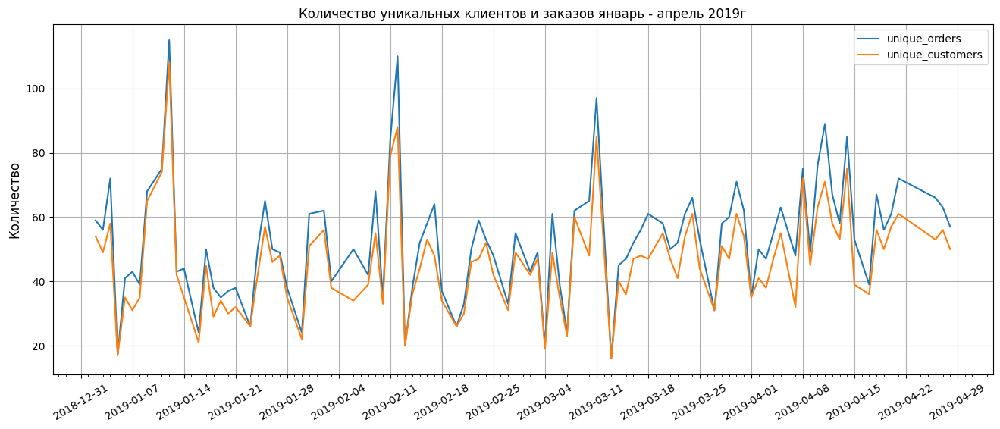

In [164]:

# построим график

plt.figure(figsize=(16, 6))
plt.plot(df_gift_count_ord_cust_2['date'], df_gift_count_ord_cust_2['count_orders'], label = 'unique_orders')
plt.plot(df_gift_count_ord_cust_2['date'], df_gift_count_ord_cust_2['count_customers'], label = 'unique_customers')
plt.legend()
plt.title('Количество уникальных клиентов и заказов январь - апрель 2019г')
plt.ylabel('Количество', fontsize=12)

# Настройка меток на оси X
ax = plt.gca()

# Устанавливаем частые метки (например, каждую неделю)
ax.xaxis.set_major_locator(mdates.WeekdayLocator(byweekday=0,interval=1))  # Каждую неделю
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))

# Дополнительно можно добавить минорные метки (например, каждый день)
ax.xaxis.set_minor_locator(mdates.DayLocator(interval=1))

plt.xticks(rotation = 30)
plt.grid()
plt.show()

По графику видно, что 

- наблюдается цикличность по неделям, а именно: в начале недели идет спад покупательской активности
- есть аномальные всплески активности, например в начале марта, в середине февраля, в январе (возможнос связаны с праздниками)
- уникальных покупателей меньше, чем уникальных заказов, хотя 1 заказу соответствует 1 покупатель, это связано с тем, что id многих покупателей(25%) записан как -1, что скорее всего является ошибкой логирования (передадим информацию инженерам)

In [165]:
# Постройте графики и сделайте вывод о наличии цикличности в покупательской активности (по часам)
# чтобы увидеть динамику по дням возьмем меньший промежуток времени - апрель 2019г (нет праздников)
df_gift_count_ord_cust = df_gift.query('entry_date >= "2019-04-01" and entry_date < "2019-05-01" ')\
                                .groupby(['day','day_of_week','time'])\
                                .agg(count_orders = ('order_id','nunique'), count_customers = ('customer_id','nunique'))\
                                .reset_index()
df_gift_count_ord_cust

,day,day_of_week,time,count_orders,count_customers
0,1,Monday,10,6,6
1,1,Monday,11,5,5
2,1,Monday,12,5,5
3,1,Monday,13,7,7
4,1,Monday,14,6,6
...,...,...,...,...,...
204,28,Sunday,15,6,6
205,28,Sunday,16,7,7
206,28,Sunday,17,1,1
207,28,Sunday,18,1,1


In [166]:
# Создаем сводную таблицу для heatmap

pivot_df_gift = df_gift_count_ord_cust.pivot_table(
    index=['day','day_of_week'],      # Дни месяца (1-31)
    columns='time',   # Часы (0-23)
    values='count_orders',  # Колонка с количеством заказов
    aggfunc='sum',    # Суммируем заказы по дню и часу
    fill_value=0      # Заполняем нулями отсутствующие комбинации
)
pivot_df_gift

,time,7,8,9,10,11,12,13,14,15,16,17,18,19,20
day,day_of_week,,,,,,,,,,,,,,
1,Monday,0,0,0,6,5,5,7,6,5,1,0,0,0,0
2,Tuesday,0,3,6,4,9,5,8,10,3,2,0,0,0,0
3,Wednesday,0,2,7,9,3,9,7,6,2,1,1,0,0,0
4,Thursday,0,1,3,5,3,16,8,8,4,7,0,0,0,0
5,Friday,0,4,2,3,16,7,9,11,6,4,1,0,0,0
7,Sunday,0,0,0,6,10,8,8,3,9,4,0,0,0,0
8,Monday,0,1,1,8,5,8,6,7,9,9,11,7,2,1
9,Tuesday,0,0,0,3,7,12,10,6,7,4,0,0,0,0
10,Wednesday,0,5,10,9,8,13,9,10,9,3,0,0,0,0


Text(0.5, 1.0, 'Heatmap количества заказов с разделением по дням и часам апрель 2019г')

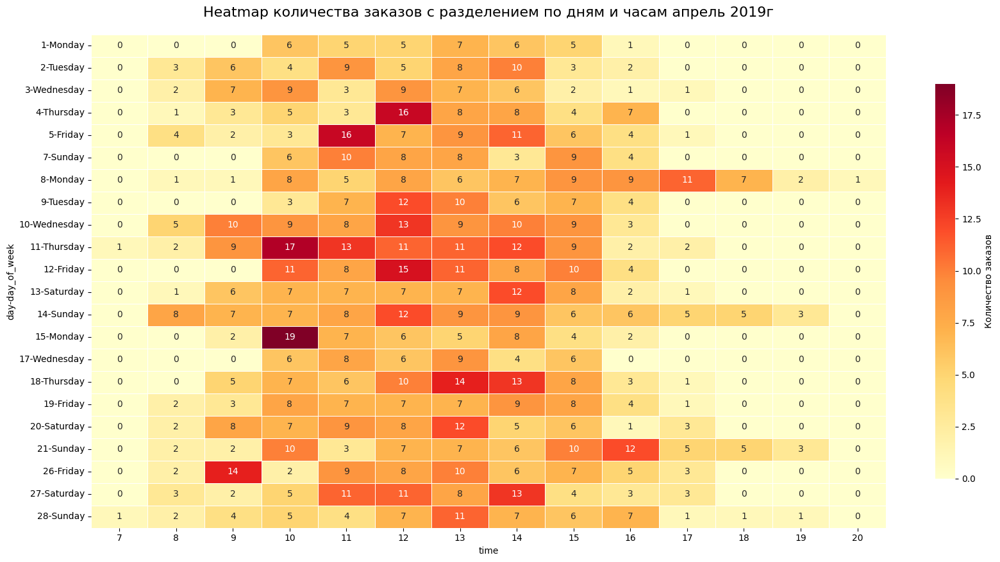

In [167]:
# Создаем heatmap
plt.figure(figsize=(20, 10))

# Heatmap с настройками
sns.heatmap(
    pivot_df_gift,
    cmap='YlOrRd',           # Желто-оранжево-красная палитра
    annot=True,               # Показывать числа в ячейках
    fmt='d',                  # Целочисленный формат
    linewidths=0.5,           # Линии между ячейками
    linecolor='white',        # Белые линии разделители
    cbar_kws={
        'label': 'Количество заказов',
        'shrink': 0.8
    }
)

plt.title('Heatmap количества заказов с разделением по дням и часам апрель 2019г', fontsize=16, pad=20)

цикличность видна, с 9 утра до 16 вечер больше всего создается заказов
дни с самыми большими количеством заказов - воскресенье и понедельник
дни с наименьшими количесвом заказов - черверг и среда

По графику видно, что 

- наблюдается цикличность по часам, а именно:  с 9 утра до 15 дня больше всего создается заказов
- есть топ часы заказов: с 10 до 12

## Задача 2

Рассчитайте по месяцам среднюю выручку с клиента в день и количество уникальных покупателей. (2019г)

Сделайте вывод о наличии или отсутствии сезонности, если это возможно.

In [168]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


### Рассчитайте по месяцам среднюю выручку с клиента в день (2019г)

In [169]:
# Рассчитайте по месяцам среднюю выручку с клиента в день

df_gift_revenue_per_date = (df_gift.query('year == 2019')
                                 .groupby('date')
                                 .agg(count_customers = ('customer_id','nunique'), revenue = ('sum','sum'))
                                 .reset_index())
df_gift_revenue_per_date['revenue_per_day'] = df_gift_revenue_per_date['revenue'] / df_gift_revenue_per_date['count_customers']

df_gift_revenue_per_date

,date,count_customers,revenue,revenue_per_day
0,2019-01-02,54,1790964.0,33166.000000
1,2019-01-03,49,1227409.0,25049.163265
2,2019-01-04,58,1668453.0,28766.431034
3,2019-01-05,17,487519.0,28677.588235
4,2019-01-06,35,1472579.0,42073.685714
...,...,...,...,...
272,2019-11-25,65,3212342.0,49420.646154
273,2019-11-27,51,1304884.0,25585.960784
274,2019-11-28,93,3248629.0,34931.494624
275,2019-11-29,106,4852845.0,45781.556604


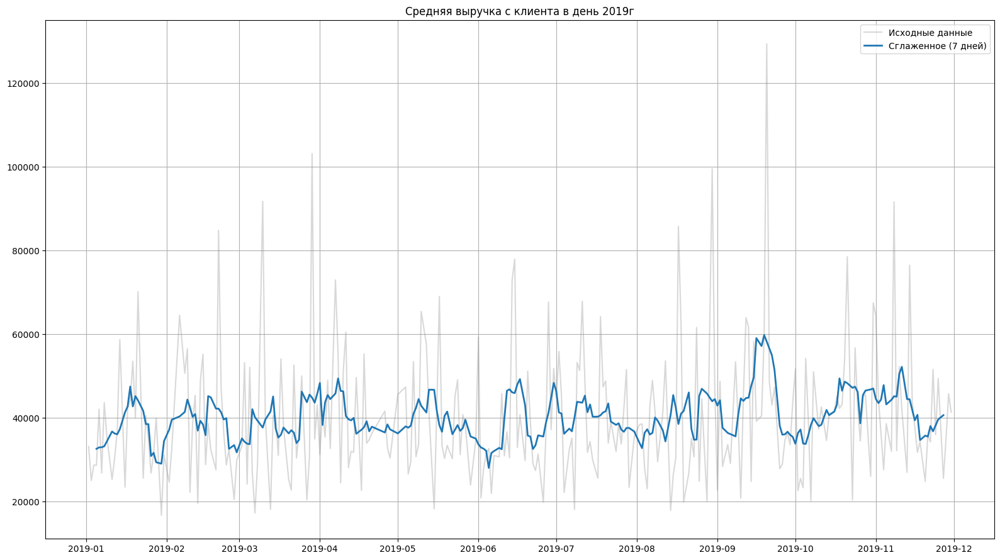

In [170]:
# построим график

plt.figure(figsize=(16, 9))
plt.plot(df_gift_revenue_per_date['date'], 
         df_gift_revenue_per_date['revenue_per_day'],
         alpha=0.3, color='gray', label='Исходные данные')

plt.plot(df_gift_revenue_per_date['date'], 
         df_gift_revenue_per_date['revenue_per_day'].rolling(window=7, center=True).mean(),
         linewidth=2, label='Сглаженное (7 дней)')
plt.title('Средняя выручка с клиента в день 2019г')
plt.legend()
#plt.grid(alpha=0.3)
plt.grid()
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.tight_layout()
plt.show()

По графику видно, что 

- данные волатильны: четкая сезонность по метрике средняя выручка с клиента в день не выражена
- был спад в 6 месяце (июнь) и резкий пик в 9 месяце (сентябрь)

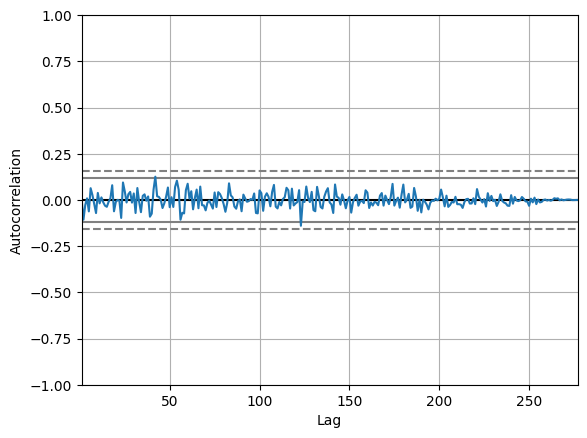

In [171]:
# посмотрим на автокорреляцию
pd.plotting.autocorrelation_plot(df_gift_revenue_per_date['revenue_per_day'])  
plt.show()

автокорреляция волотильна с пределах -0.25 до 0.25 -> выраженная сезонность отсутствует

### Рассчитайте по месяцам среднюю выручку с клиента в день (2019г) - общий тренд

In [172]:
# Рассчитайте по месяцам среднюю выручку с клиента в день

df_gift_revenue_per_day = (df_gift.query('year == 2019')
                                 .groupby(['month', 'day'])
                                 .agg(count_customers = ('customer_id','nunique'), revenue = ('sum','sum'))
                                 .reset_index())
df_gift_revenue_per_day['revenue_per_day'] = df_gift_revenue_per_day['revenue'] / df_gift_revenue_per_day['count_customers']

df_gift_revenue_per_day

,month,day,count_customers,revenue,revenue_per_day
0,1,2,54,1790964.0,33166.000000
1,1,3,49,1227409.0,25049.163265
2,1,4,58,1668453.0,28766.431034
3,1,5,17,487519.0,28677.588235
4,1,6,35,1472579.0,42073.685714
...,...,...,...,...,...
272,11,25,65,3212342.0,49420.646154
273,11,27,51,1304884.0,25585.960784
274,11,28,93,3248629.0,34931.494624
275,11,29,106,4852845.0,45781.556604


In [173]:
df_gift_mean_revenue_per_day = df_gift_revenue_per_day.groupby('month')\
                       .agg(mean_revenue_per_day = ('revenue_per_day','mean'))\
                       .reset_index()\
                       .sort_values(by = 'month')
df_gift_mean_revenue_per_day

,month,mean_revenue_per_day
0,1,36011.865433
1,2,39383.479489
2,3,40005.120982
3,4,40190.735650
4,5,39625.650824
5,6,38720.901218
6,7,40261.951639
7,8,40782.777043
8,9,43940.928057
9,10,41829.011981


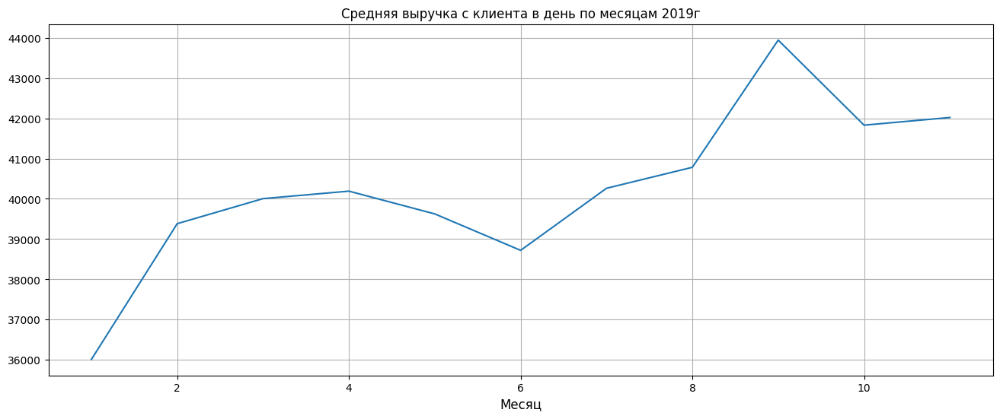

In [174]:
# построим график

plt.figure(figsize=(16, 6))
plt.plot(df_gift_mean_revenue_per_day['month'], df_gift_mean_revenue_per_day['mean_revenue_per_day'])
plt.title('Средняя выручка с клиента в день по месяцам 2019г')
plt.xlabel('Месяц', fontsize=12)
plt.grid()
plt.show()

По графику видно, что 

- наблюдается положительный тренд увелическия средней выручки по дням от месяца к месяцу 
- был спад в 6 месяце (июнь) и резкий пик в 9 месяце (сентябрь)

### Рассчитайте по месяцам количество уникальных покупателей. (2019г)

In [175]:
# Рассчитайте по месяцам количество уникальных покупателей

df_gift_revenue_per_date = (df_gift.query('year == 2019')
                                 .groupby('date')
                                 .agg(count_customers = ('customer_id','nunique'), revenue = ('sum','sum'))
                                 .reset_index())
df_gift_revenue_per_date['revenue_per_day'] = df_gift_revenue_per_date['revenue'] / df_gift_revenue_per_date['count_customers']

df_gift_revenue_per_date

,date,count_customers,revenue,revenue_per_day
0,2019-01-02,54,1790964.0,33166.000000
1,2019-01-03,49,1227409.0,25049.163265
2,2019-01-04,58,1668453.0,28766.431034
3,2019-01-05,17,487519.0,28677.588235
4,2019-01-06,35,1472579.0,42073.685714
...,...,...,...,...
272,2019-11-25,65,3212342.0,49420.646154
273,2019-11-27,51,1304884.0,25585.960784
274,2019-11-28,93,3248629.0,34931.494624
275,2019-11-29,106,4852845.0,45781.556604


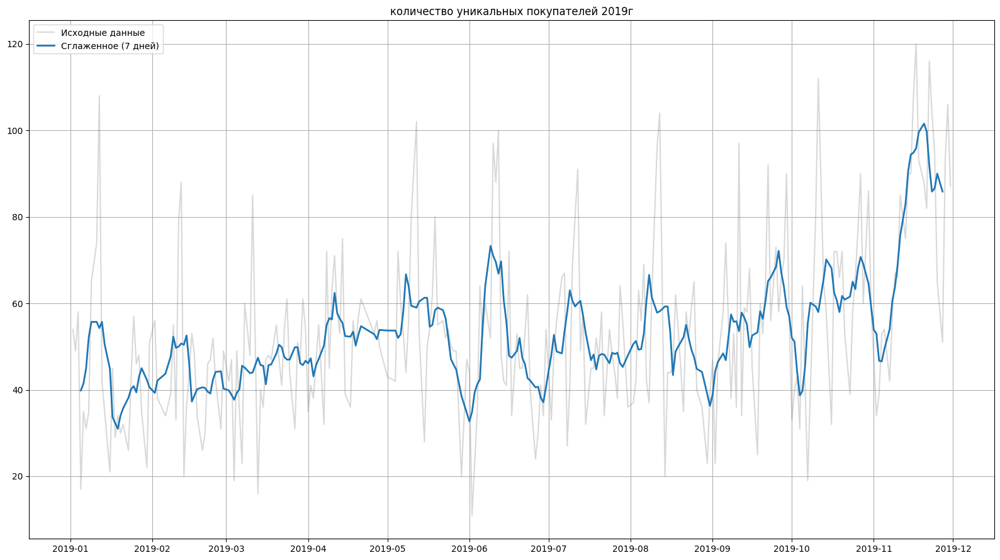

In [176]:
# построим график

plt.figure(figsize=(16, 9))
plt.plot(df_gift_revenue_per_date['date'], 
         df_gift_revenue_per_date['count_customers'],
         alpha=0.3, color='gray', label='Исходные данные')

plt.plot(df_gift_revenue_per_date['date'], 
         df_gift_revenue_per_date['count_customers'].rolling(window=7, center=True).mean(),
         linewidth=2, label='Сглаженное (7 дней)')
plt.title('количество уникальных покупателей 2019г')
plt.legend()
#plt.grid(alpha=0.3)
plt.grid()
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.tight_layout()
plt.show()

По графику видно, что 

- наблюдается положительные тренд на увеличение числа уникальных покупателей по дням
- очевидно выраженная сезонность по всем данным отсутствует
- в сентября и в октябре присутствует сезонность

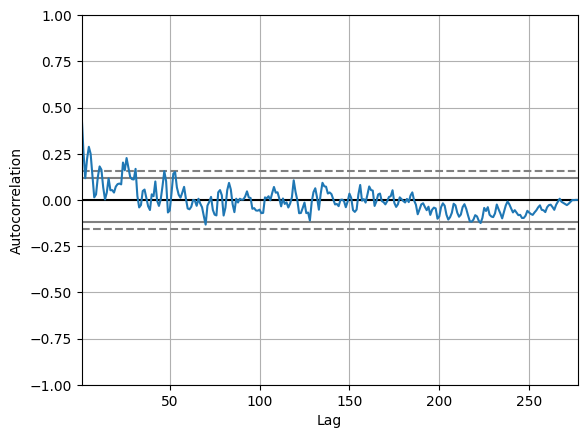

In [177]:
pd.plotting.autocorrelation_plot(df_gift_revenue_per_date['count_customers'])  
plt.show()

График автокорреляции так же показывает, что очевидно выраженной сезонности нет

## Задача 3

Рассчитайте стики-фактор(DAU/MAU) за второй и третий квартал 2019 года (4-9 месяц). 
Sticky Factor - это метрика, показывающая, насколько хорошо продукт удерживает пользователей.

In [178]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


In [179]:
DAU = df_gift.query('month >= 4 and month <= 9').groupby(['month','date']).agg(DAU = ('customer_id', 'nunique')).reset_index()
DAU

,month,date,DAU
0,4,2019-04-01,35
1,4,2019-04-02,41
2,4,2019-04-03,38
3,4,2019-04-04,47
4,4,2019-04-05,55
...,...,...,...
146,9,2019-09-26,58
147,9,2019-09-27,66
148,9,2019-09-28,70
149,9,2019-09-29,90


In [180]:
MAU = df_gift.query('month >= 4 and month <= 9').groupby('month').agg(MAU = ('customer_id', 'nunique')).reset_index()
MAU

,month,MAU
0,4,872
1,5,981
2,6,1012
3,7,1045
4,8,938
5,9,1162


In [181]:
MAU_DAU = pd.merge(DAU, MAU, on = 'month', how = 'outer' ) 
MAU_DAU

,month,date,DAU,MAU
0,4,2019-04-01,35,872
1,4,2019-04-02,41,872
2,4,2019-04-03,38,872
3,4,2019-04-04,47,872
4,4,2019-04-05,55,872
...,...,...,...,...
146,9,2019-09-26,58,1162
147,9,2019-09-27,66,1162
148,9,2019-09-28,70,1162
149,9,2019-09-29,90,1162


In [182]:
MAU_DAU['sticky_factor'] = MAU_DAU['DAU'] / MAU_DAU['MAU']
MAU_DAU

,month,date,DAU,MAU,sticky_factor
0,4,2019-04-01,35,872,0.040138
1,4,2019-04-02,41,872,0.047018
2,4,2019-04-03,38,872,0.043578
3,4,2019-04-04,47,872,0.053899
4,4,2019-04-05,55,872,0.063073
...,...,...,...,...,...
146,9,2019-09-26,58,1162,0.049914
147,9,2019-09-27,66,1162,0.056799
148,9,2019-09-28,70,1162,0.060241
149,9,2019-09-29,90,1162,0.077453


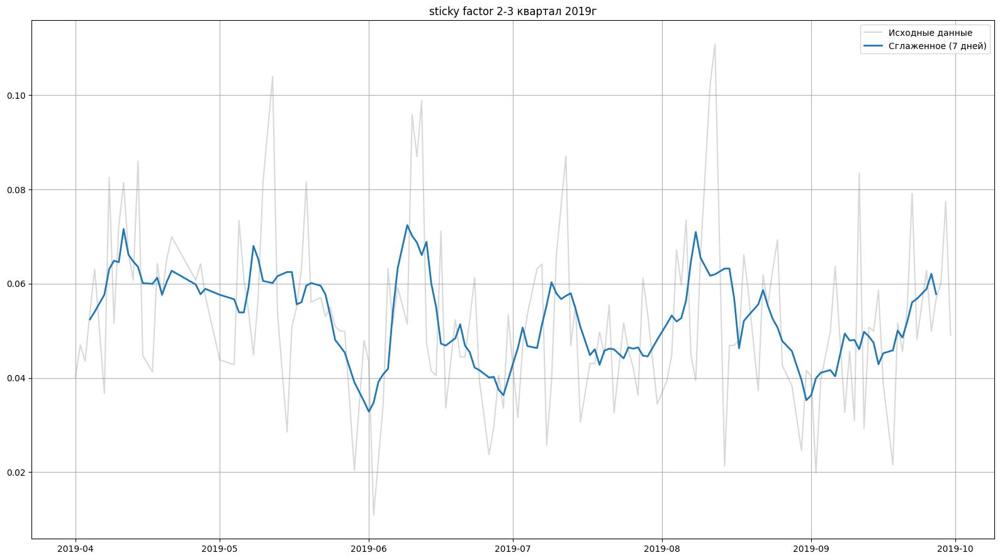

In [183]:
# построим график

plt.figure(figsize=(16, 9))
plt.plot(MAU_DAU['date'],
         MAU_DAU['sticky_factor'],
         alpha=0.3, color='gray', label='Исходные данные')

plt.plot(MAU_DAU['date'], 
         MAU_DAU['sticky_factor'].rolling(window=7, center=True).mean(),
         linewidth=2, label='Сглаженное (7 дней)')

plt.title('sticky factor 2-3 квартал 2019г')
plt.legend()
#plt.grid(alpha=0.3)
plt.grid()
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())
plt.tight_layout()
plt.show()

По графику видно, что 

- наблюдается низкое удержание пользователей (метрика ниже 0.1)

## Задача 4

Составьте профиль каждого клиента, включите в профиль 
- количество заказов
- дату первого заказа
- дату последнего заказа
- общую сумму всех заказов
- среднюю цену заказа
- другие показатели по вашему выбору (какой заказ(entry) был первым у пользовтеля)

In [184]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


In [185]:
df_gift_cust_profile = (df_gift.sort_values(['customer_id', 'entry_date'])
                                             .groupby('customer_id')
                                             .agg(count_orders = ('order_id','nunique'),
                                                first_order_date = ('entry_date','min'),
                                                last_order_date = ('entry_date','max'),
                                                orders_price = ('sum','sum'),
                                                first_entry = ('entry', 'first') # какой заказ(entry) был первым у пользовтеля
                                               )). reset_index()
df_gift_cust_profile['mean_order_price'] = df_gift_cust_profile['orders_price']/df_gift_cust_profile['count_orders']
df_gift_cust_profile.head()

,customer_id,count_orders,first_order_date,last_order_date,orders_price,first_entry,mean_order_price
0,-1,1180,2019-01-02 10:56:00,2019-11-30 15:33:00,103358577.5,первоклассный праздничный кошелек,87592.014831
1,1713,2,2019-05-22 10:39:00,2019-10-28 09:29:00,61114.0,маленький фиолетовый блокнот для бабушки,30557.000000
2,1717,14,2019-01-23 14:58:00,2019-11-30 12:59:00,152389.0,рукавица для духовки для приготовления чая,10884.928571
3,1718,2,2019-02-12 11:43:00,2019-05-08 13:35:00,11886.0,подставка для торта regency 3 яруса,5943.000000
4,1720,1,2019-07-03 09:52:00,2019-07-03 09:52:00,13290.0,деревянная черная доска с белой отделкой,13290.000000


## Задача 5

Разделите клиентов на возвратных и нет по признаку наличия повторных покупок, для каждой из групп на основе профилей клиентов (когда это возможно) рассчитайте средние показатели и оцените их.

In [186]:
df_gift_cust_profile_return = df_gift_cust_profile.query('count_orders >= 2')
df_gift_cust_profile_not_return = df_gift_cust_profile.query('count_orders < 2')
print(df_gift_cust_profile_return.shape)
print(df_gift_cust_profile_return.shape)

(2597, 7)
(2597, 7)


In [187]:
# для возвратных клиентов
df_gift_cust_profile_return.describe(include = 'all')

,customer_id,count_orders,first_order_date,last_order_date,orders_price,first_entry,mean_order_price
count,2597.000000,2597.000000,2597,2597,2.597000e+03,2597,2597.000000
unique,NaN,NaN,NaN,NaN,NaN,1075,NaN
top,NaN,NaN,NaN,NaN,NaN,подставка для торта regency 3 яруса,NaN
freq,NaN,NaN,NaN,NaN,NaN,47,NaN
mean,4703.391221,5.953793,2019-04-04 03:19:23.634963456,2019-10-02 23:10:46.415094528,2.178424e+05,NaN,26843.404744
min,-1.000000,2.000000,2019-01-02 08:23:00,2019-01-03 13:51:00,6.900000e+02,NaN,345.000000
25%,3220.000000,2.000000,2019-01-26 15:31:00,2019-09-06 19:40:00,4.054200e+04,NaN,13052.000000
50%,4728.000000,4.000000,2019-03-11 16:40:00,2019-10-28 09:29:00,7.708000e+04,NaN,20526.500000
75%,6173.000000,6.000000,2019-05-22 10:47:00,2019-11-20 12:46:00,1.578120e+05,NaN,30866.800000
max,7653.000000,1180.000000,2019-11-29 13:04:00,2019-11-30 17:37:00,1.033586e+08,NaN,741100.000000


Для возвратных клиентов:
- среднее число заказов - 6, медианное - 4
- средняя сумма всех заказов - 217842 , медианная - 77080 (есть выбросы)
- средняя цена заказа - 26843, медианная - 20526
- чаще всего первая покупка была - 'подставка для торта regency 3 яруса'

In [188]:
# для невозвратных клиентов
df_gift_cust_profile_not_return.describe(include = 'all')

,customer_id,count_orders,first_order_date,last_order_date,orders_price,first_entry,mean_order_price
count,1502.000000,1502.0,1502,1502,1502.000000,1502,1502.000000
unique,NaN,NaN,NaN,NaN,NaN,788,NaN
top,NaN,NaN,NaN,NaN,NaN,подставка для торта regency 3 яруса,NaN
freq,NaN,NaN,NaN,NaN,NaN,35,NaN
mean,4683.367510,1.0,2019-07-10 00:22:07.669773568,2019-07-10 00:22:07.749667072,24641.948735,NaN,24641.948735
min,1720.000000,1.0,2019-01-02 09:01:00,2019-01-02 09:01:00,290.000000,NaN,290.000000
25%,3224.750000,1.0,2019-04-10 21:00:30,2019-04-10 21:00:30,9822.500000,NaN,9822.500000
50%,4670.000000,1.0,2019-07-17 14:52:30,2019-07-17 14:52:30,17037.500000,NaN,17037.500000
75%,6199.750000,1.0,2019-10-11 16:50:00,2019-10-11 16:50:00,28450.750000,NaN,28450.750000
max,7651.000000,1.0,2019-11-30 16:19:00,2019-11-30 16:19:00,375346.000000,NaN,375346.000000


Для невозвратных клиентов (только 1 заказ):

- средняя сумма заказа - 24641 , медианная - 28450
- чаще всего первая покупка была - 'подставка для торта regency 3 яруса'

# RFM-сегментация клиентов

## Разделить клиентов на группы по методике RFM

RFM-анализ — это метод сегментации, который позволяет разделить пользователей на группы в зависимости от частоты и суммы покупок. На основе этого выбирают клиентские категории, на которые стоит направить маркетинговые усилия. Каждого клиента оценивают по трём факторам RFM:

Recency (пер. «давность») — сколько времени прошло с момента последней покупки; (давно относит недавно недавно)\
Frequency (пер. «частота») — как часто клиент покупает; (редко нечасто часто)\
Monetary (пер. «деньги») — сколько денег потратил клиент на товары или услуги. (мало средне много)

In [189]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


In [190]:
# день по которому проводим анализ
df_gift['entry_date'].max()

Timestamp('2019-11-30 17:37:00')

In [191]:
# customer_id == -1 исключим из анализа, тк это 1 клиент, который будет портить статистику общую

df_gift_rfm = df_gift.query('customer_id != -1')

In [192]:
# Рассчитаем количество дней с момента покупки до момента анализа:
df_gift_rfm['order_recency'] = pd.to_datetime('2019-11-30') - df_gift_rfm['date'].astype('datetime64[ns]')
df_gift_rfm.head(2)

/var/folders/1m/_cc5v4wx43s99wlnr_pwjkf80000gn/T/ipykernel_87202/3003604391.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gift_rfm['order_recency'] = pd.to_datetime('2019-11-30') - df_gift_rfm['date'].astype('datetime64[ns]')


,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week,order_recency
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday,243 days
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday,243 days


In [193]:
# Сгруппируем данные для каждого пользователя и рассчитаем данные для RMF анализа:
rfm = df_gift_rfm.groupby('customer_id').agg( 
                                        # Количество дней с последнего заказа:    
                                        recency = ('order_recency', lambda x: x.min().days),
                                        # Количество заказов за период времени: 
                                        frequency = ('order_id', 'nunique'),
                                        # Сумма стоимости всех заказов: 
                                        monetary_value = ('sum', 'sum')
                                        
                                    ).reset_index()

rfm.head(3)

,customer_id,recency,frequency,monetary_value
0,1713,33,2,61114.0
1,1717,0,14,152389.0
2,1718,206,2,11886.0


In [194]:
# Выделим группу пользователя по количеству дней с момента последнего заказа: 
rfm['r'] = pd.qcut(rfm['recency'], q=3, labels=[3,2,1])


In [195]:
rfm['frequency'].describe()

count    4098.000000
mean        3.851635
std         6.109564
min         1.000000
25%         1.000000
50%         2.000000
75%         4.000000
max       167.000000
Name: frequency, dtype: float64

In [196]:
# Выделим группу пользователя по количеству заказов: 
rfm['f'] = pd.cut(rfm['frequency'], [0, 1, 4, 1000], labels=[1,2,3])

In [197]:
# Выделим группу пользователя по сумме стоимости заказов: 
rfm['m'] = pd.qcut(rfm['monetary_value'], q=3, labels=[1,2,3])

In [198]:
rfm.head(2)

,customer_id,recency,frequency,monetary_value,r,f,m
0,1713,33,2,61114.0,2,2,2
1,1717,0,14,152389.0,3,3,3


In [199]:
# Найдём групповой RFM-индекс:
rfm['rfm_group'] = rfm['r'].astype(str) + rfm['f'].astype(str) + rfm['m'].astype(str)
rfm['sum'] = rfm['r'].astype(int) + rfm['f'].astype(int) + rfm['m'].astype(int)
rfm.head(2)

,customer_id,recency,frequency,monetary_value,r,f,m,rfm_group,sum
0,1713,33,2,61114.0,2,2,2,222,6
1,1717,0,14,152389.0,3,3,3,333,9


In [200]:
# Сгруппируем данные по сегментам и подсчитаем их размер и сумму индексов:
rfm_group = rfm.groupby('rfm_group').agg(count_customers = ('customer_id','nunique'), sum = ('sum','mean')).reset_index()

# Выведем на экран результат:
print(rfm_group.sort_values(by = 'count_customers', ascending = False))

   rfm_group  count_customers  sum
0        111              613  3.0
25       333              565  9.0
12       222              322  6.0
21       322              288  7.0
8        211              278  4.0
16       233              252  8.0
4        122              247  5.0
1        112              207  4.0
13       223              193  7.0
22       323              172  8.0
17       311              154  5.0
9        212              143  5.0
3        121              126  4.0
11       221              106  5.0
5        123               96  6.0
20       321               82  6.0
24       332               55  8.0
18       312               49  6.0
15       232               46  7.0
2        113               31  5.0
7        133               30  7.0
10       213               20  6.0
6        132                9  6.0
19       313                7  7.0
23       331                4  7.0
14       231                3  6.0


## Оценить получившиеся группы, найдите похожие и различающиеся

In [201]:
rfm_group.head(2)

,rfm_group,count_customers,sum
0,111,613,3.0
1,112,207,4.0


In [202]:
rfm_group.groupby('sum').agg(count_customers_sum = ('count_customers','sum')).reset_index()

,sum,count_customers_sum
0,3.0,613
1,4.0,611
2,5.0,681
3,6.0,581
4,7.0,568
5,8.0,479
6,9.0,565


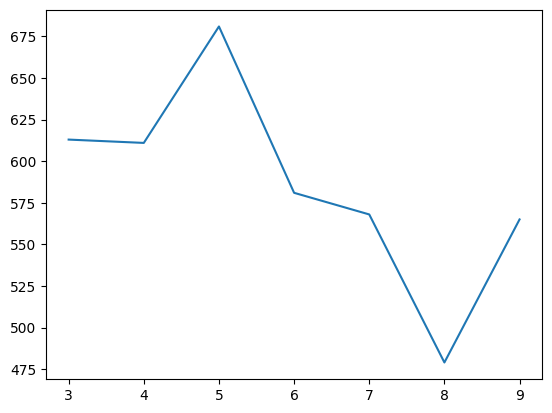

In [203]:
plt.plot(rfm_group.groupby('sum').agg(count_customers_sum = ('count_customers','sum')).reset_index()['sum'],
        rfm_group.groupby('sum').agg(count_customers_sum = ('count_customers','sum')).reset_index()['count_customers_sum'])
plt.show()

In [204]:
# Построим график treemap для визуализации результатов RFM сегментации:
fig = px.treemap(rfm_group, 
                 path=['rfm_group'], # Выбираем RFM-сегменты 
                 values='count_customers', # Устанавливаем размер - количество покупателей
                 color='sum', # Цвет сегмента будет определять сумма RFM 
                 color_continuous_scale='Sunset',
                 title='RFM сегментация пользователей магазина «Подарочек»')

# Отобразим график:
fig.show()

# Recency (пер. «давность») — сколько времени прошло с момента последней покупки; (давно относит недавно недавно)
# Frequency (пер. «частота») — как часто клиент покупает; (редко нечасто часто)
# Monetary (пер. «деньги») — сколько денег потратил клиент на товары или услуги. (мало средне много)

## Cформулировать рекомендации для бизнеса по взаимодействию с сегментами, сопроводив их подходящими графиками и таблицами.

Рекомендации:
- в целом сегменты относительно сбалансированы по количеству в них пользоавтелей в разрезе суммы rfm
- стоит попробовать через акции или промокоды заинтересовать клиента остаться с магазином и совершить последующие покупки

# Проверка статистических гипотез

## Сравните доли возвратных и невозвратных клиентов за второй и третий квартал 2019 года при помощи подходящего статистического теста.

Будем использовать z - тест для пропорций 

H0: значимой разницы между долями нет\
H1: значимая разница между долями есть

In [205]:
df_gift.head(3)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday
27203,2019-04-01 10:00:00,6659,6687,10,125.0,427,1582,28,2019-04-01,10,красная сумка-шоппер retrospot,1250.0,1,2019,4,Monday


In [206]:
df_gift_2_quater = df_gift.query('month >= 4 and month <= 6')
df_gift_3_quater = df_gift.query('month >= 7 and month <= 9')

In [207]:
df_gift_2_quater = (df_gift_2_quater.groupby('customer_id')
                                        .agg(count_orders = ('order_id','nunique'))
                                        .reset_index())
df_gift_3_quater = (df_gift_3_quater.groupby('customer_id')
                                        .agg(count_orders = ('order_id','nunique'))
                                        .reset_index())


In [208]:
print(len(df_gift_2_quater))
display(df_gift_2_quater.head(2))

print(len(df_gift_3_quater))
display(df_gift_3_quater.head(2))


2018


,customer_id,count_orders
0,-1,328
1,1713,1


2173


,customer_id,count_orders
0,-1,312
1,1717,1


In [209]:
df_gift_2_quater_cust_return = df_gift_2_quater.query('count_orders >= 2')
df_gift_2_quater_cust_not_return = df_gift_2_quater.query('count_orders < 2')
print(f'2_quater: all: {len(df_gift_2_quater)} return: {len(df_gift_2_quater_cust_return)}, not_return: {len(df_gift_2_quater_cust_not_return)}')

df_gift_3_quater_cust_return = df_gift_3_quater.query('count_orders >= 2')
df_gift_3_quater_cust_not_return = df_gift_3_quater.query('count_orders < 2')
print(f'3_quater: all: {len(df_gift_3_quater)} return: {len(df_gift_3_quater_cust_return)}, not_return: {len(df_gift_3_quater_cust_not_return )}')

2_quater: all: 2018 return: 849, not_return: 1169
3_quater: all: 2173 return: 941, not_return: 1232


In [210]:
# Записываем данные в нужном формате
successes = [len(df_gift_2_quater_cust_return), len(df_gift_3_quater_cust_return)]
attempts = [len(df_gift_2_quater), len(df_gift_3_quater)]

# Устанавливаем уровень значимости
alpha = 0.05

# Проводим тест
z_stat, p_value = proportions_ztest(count=successes, nobs=attempts, alternative='two-sided')

# Выводим результаты
print(f"z-statistic: {z_stat}, p-value: {p_value}")

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: существует значимая разница между долями.")
else:
    print("Не отвергаем нулевую гипотезу: значимой разницы между долями нет.")

z-statistic: -0.806176001212728, p-value: 0.42014137428914133
Не отвергаем нулевую гипотезу: значимой разницы между долями нет.


## Сравните средние чеки в странах с country_id, равному 3, 6 и 24. На основе статистических тестов сделайте вывод о том, отличаются ли средние чеки в этих странах или нет.

In [211]:
df_gift.head(2)

,entry_date,order_id,customer_id,quantity,price,name_clust,entry_id,country_id,date,time,entry,sum,day,year,month,day_of_week
27201,2019-04-01 10:00:00,6659,6687,10,195.0,898,958,28,2019-04-01,10,большая сумка розового цвета в горошек,1950.0,1,2019,4,Monday
27202,2019-04-01 10:00:00,6659,6687,5,210.0,424,1751,28,2019-04-01,10,мешок для переработки,1050.0,1,2019,4,Monday


In [212]:
df_gift.query('country_id in [3,6,24]')\
       .groupby('country_id')\
       .agg(count_orders = ('order_id','nunique'), revenue = ('sum','sum'))

,count_orders,revenue
country_id,,
3,89,2865798.0
6,410,14797751.0
24,31,2445978.0


In [213]:
# средний чек в 3 стране
df_gift_country_3 = df_gift.query('country_id == 3')\
                           .groupby('order_id')\
                           .agg(revenue = ('sum','sum')).reset_index()
print(len(df_gift_country_3))
display(df_gift_country_3.head(2))

# средний чек в 6 стране
df_gift_country_6 = df_gift.query('country_id == 6')\
                           .groupby('order_id')\
                           .agg(revenue = ('sum','sum')).reset_index()
print(len(df_gift_country_6))
display(df_gift_country_6.head(2))

# средний чек в 24 стране
df_gift_country_24 = df_gift.query('country_id == 24')\
                           .groupby('order_id')\
                           .agg(revenue = ('sum','sum')).reset_index()
print(len(df_gift_country_24))
display(df_gift_country_6.head(2))

89


,order_id,revenue
0,8341,15330.0
1,8657,18160.0


410


,order_id,revenue
0,7076,35020.0
1,7080,52621.0


31


,order_id,revenue
0,7076,35020.0
1,7080,52621.0


Используем  ttest тк:

- у нас по каждой стране есть выборка из n > 30 позиций
- данные количественные

(размер выборок отличается кратно, следовательно лучше взять ttest Уэлча (equal_var=False))

Сравнение среднего чека для 3 и 6 страны

H0: значимой разницы нет в средних чеках\
H1: значимая разница есть в средних чеках


In [214]:
# Сравнение 3 и 6

# Устанавливаем уровень значимости
alpha = 0.05

# Выполнение t-теста для независимых выборок
t_stat, p_value = ttest_ind(df_gift_country_3['revenue'], df_gift_country_6['revenue'], 
                            equal_var=False)
 
# Вывод результатов                         
print(f"t-statistic: {t_stat}, p-value: {p_value}")

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: существует значимая разница.")
else:
    print("Не отвергаем нулевую гипотезу: значимой разницы нет.")

t-statistic: -1.3459922543712939, p-value: 0.18003070461308385
Не отвергаем нулевую гипотезу: значимой разницы нет.


Сравнение среднего чека для 3 и 24 страны

H0: значимой разницы нет в средних чеках\
H1: значимая разница есть в средних чеках

In [215]:
# Сравнение 3 и 24

# Устанавливаем уровень значимости
alpha = 0.05

# Выполнение t-теста для независимых выборок
t_stat, p_value = ttest_ind(df_gift_country_3['revenue'], df_gift_country_24['revenue'], 
                            equal_var=False)
 
# Вывод результатов                         
print(f"t-statistic: {t_stat}, p-value: {p_value}")

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: существует значимая разница.")
else:
    print("Не отвергаем нулевую гипотезу: значимой разницы нет.")

t-statistic: -2.160181547145131, p-value: 0.038669623849365245
Отвергаем нулевую гипотезу: существует значимая разница.


Сравнение среднего чека для 6 и 24 страны

H0: значимой разницы нет в средних чеках\
H1: значимая разница есть в средних чеках

In [216]:
# Сравнение 6 и 24

# Устанавливаем уровень значимости
alpha = 0.05

# Выполнение t-теста для независимых выборок
t_stat, p_value = ttest_ind(df_gift_country_6['revenue'], df_gift_country_24['revenue'], 
                            equal_var=False)
 
# Вывод результатов                         
print(f"t-statistic: {t_stat}, p-value: {p_value}")

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: существует значимая разница.")
else:
    print("Не отвергаем нулевую гипотезу: значимой разницы нет.")

t-statistic: -1.9869679120252293, p-value: 0.056021440764390695
Не отвергаем нулевую гипотезу: значимой разницы нет.


Итог:

страны 3-6 значимой разницы нет в средних чеках\
страны 3-24 существует значимая разница в средних чеках\
страны 6-24 значимой разницы нет в средних чеках

## Провести t-тест для связанных выборок

Сравнить средний чек для одних и тех же покупателей в 2 и в 3 квартале 2019года


H0: значимой разницы нет в средних чеках\
H1: значимая разница есть в средних чеках

In [217]:
df_gift_2_quater_cust= df_gift.query('month >= 4 and month <= 6 and customer_id != -1')\
                               .groupby('customer_id')\
                               .agg(count_orders = ('sum','nunique'), revenue = ('sum','sum')).reset_index()
df_gift_2_quater_cust['AOV_2'] = df_gift_2_quater_cust['revenue']/df_gift_2_quater_cust['count_orders']


df_gift_3_quater_cust= df_gift.query('month >= 7 and month <= 9 and customer_id != -1')\
                               .groupby('customer_id')\
                               .agg(count_orders = ('sum','nunique'), revenue = ('sum','sum')).reset_index()
df_gift_3_quater_cust['AOV_3'] = df_gift_3_quater_cust['revenue']/df_gift_3_quater_cust['count_orders']

In [218]:
df_gift_3_quater_cust.head(2)

,customer_id,count_orders,revenue,AOV_3
0,1717,19,10776.0,567.157895
1,1720,6,13290.0,2215.000000


In [219]:
df_gift_2_3_cust_merge = pd.merge(df_gift_2_quater_cust, df_gift_3_quater_cust, on = 'customer_id', how = 'inner')

df_gift_2_3_cust_merge = df_gift_2_3_cust_merge[['customer_id', 'AOV_2', 'AOV_3']]
df_gift_2_3_cust_merge.head(3)

,customer_id,AOV_2,AOV_3
0,1717,2088.742857,567.157895
1,1727,10200.000000,5100.000000
2,1728,3087.142857,3059.517241


In [220]:
# Устанавливаем уровень значимости
alpha = 0.05

# Выполним парный t-тест
t_statistic, p_value = ttest_rel(df_gift_2_3_cust_merge['AOV_2'], df_gift_2_3_cust_merge['AOV_3'])

# Вывод результатов                         
print(f"t-statistic: {t_stat}, p-value: {p_value}")

if p_value < alpha:
    print("Отвергаем нулевую гипотезу: существует значимая разница.")
else:
    print("Не отвергаем нулевую гипотезу: значимой разницы нет.")

t-statistic: -1.9869679120252293, p-value: 0.8123069155595477
Не отвергаем нулевую гипотезу: значимой разницы нет.


Итог: нет стат значимой разницы в значениях среднего чека у одних и тех же пользователей во 2 и в 3 квартале 2019г

# Вывод

1) В ходе первичного анализа данных и предобработки данных были выявлены выбросы и аномальные значения, часть удалось удалить/заменить, часть будет обсудлаться с инженерами в разрезе вопросов получения верных логов
2) В ходе этапа расчета метрик были выялены следующие моменты
   - старт продаж приходится на 7 часов, конец на 20
   - пик покупательской активности приходится на часы с 10 до 15
   - день с самым большим количеством заказов - воскресенье
   - день с наименьшими количесвом заказов - вторник
   - наблюдается цикличность по неделям, а именно: в начале недели идет спад покупательской активности
   - есть аномальные всплески активности, например в начале марта, в середине февраля, в январе (возможнос связаны с праздниками)
   - метрике средняя выручка с клиента в день: (данные волатильны, четкая сезонность не выражена, спад в 6 месяце  и резкий пик в 9 месяце, тренд положительный)
   - наблюдается положительные тренд на увеличение числа уникальных покупателей по дням
   - наблюдается низкое удержание пользователей
3)  В ходе этапа  RFM - сегментации выявлено, что многие пользователи совершают только одну покупку, стоит попробовать заинтересовать клиента остаться с магазином и совершить последующие покупки
4) В ходе этапа проверки статистических гипотез выявлено
   - нет стат значимой разницы между долями возвратных и невозвратных клиентов за второй и третий квартал 2019
   - страны с id  3-6  не имеют стат значимой разницы  в средних чеках
   - страны с id 3-24 имеют стат значимую разницу в средних чеках
   - страны с id 6-24 не имеют стат значимой разницы  в средних чеках
   - средний чек для одних и тех же покупателей в 2 и в 3 квартале 2019года не имеет стат значимой разницы
